All on chromosome_1

In [6]:
import pandas as pd
import numpy as np
import math
import matplotlib.pylab as plt
import seaborn as sns
import mygene
%matplotlib inline

In [2]:
FILE_ROOT = '/storage/dana/spliceSTR/expression/'

In [10]:
expr_annot = pd.read_csv('/storage/dana/spliceSTR/expression/gencode.v19.annotations_exons.csv')
expr_annot.index = expr_annot["probe.id"].values
expr_all = {}
strgt_all = {}

for c in range(1,24):
    if c == 23:
        c = 'X'
    
    expr_all[c] = pd.read_csv('/storage/dana/spliceSTR/PSI/PSI_filtered/{}_PSI.csv'.format(c),index_col=0)
    strgt_all[c] = pd.read_csv('/storage/dana/spliceSTR/genotypes_filtered/Allele_Gentype_chr{}.table'.format(c), sep="\t", low_memory=False)

In [22]:
summary_table = pd.read_table('/storage/dana/spliceSTR/regression_final/exon_summary.tsv')
summary_table['q.values'] = sm.stats.multipletests(summary_table['p.val.bon'],alpha=0.1,method='fdr_bh')[1]
summary_table = summary_table.sort_values(by='q.values')
summary_table

,exon,chrom,str.id,beta,beta.se,p.val.bon,q.values
34234,ENSG00000166598.8_18,12,STR_104345413,-0.855954,0.029753,1.315523e-87,7.015027e-83
50914,ENSG00000125991.14_4,20,STR_34133318,-0.834470,0.031605,8.056340e-80,2.148022e-75
50312,ENSG00000221923.4_4,19,STR_52882476,0.766814,0.037058,1.436813e-58,2.553935e-54
9009,ENSG00000173272.9_3,2,STR_132232700,0.739533,0.038670,7.567773e-53,1.008879e-48
19965,ENSG00000106100.6_14,7,STR_30503323,0.789160,0.039563,4.343356e-52,4.632189e-48
36751,ENSG00000129562.6_2,14,STR_23042082,-0.768375,0.041660,4.883643e-47,4.340337e-43
1089,ENSG00000116791.9_4,1,STR_75182917,0.722972,0.041068,1.392715e-46,1.060950e-42
23400,ENSG00000104490.13_12,8,STR_102896927,0.682340,0.041997,3.967469e-43,2.644566e-39
34531,ENSG00000089127.8_5,12,STR_113362272,0.689049,0.042484,1.375311e-42,8.148719e-39
13902,ENSG00000109184.10_3,4,STR_52716000,-0.682827,0.042180,3.383850e-42,1.804438e-38


In [33]:
mg = mygene.MyGeneInfo()
genes = [gene.split('.')[0] for gene in summary_table['exon']][:200]
names = mg.querymany(genes, scopes='ensembl.gene')

querying 1-200...done.
Finished.
17 input query terms found dup hits:
	[('ENSG00000221947', 2), ('ENSG00000104714', 3), ('ENSG00000176155', 2), ('ENSG00000144559', 2), ('E
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


In [37]:
names[0]

{'_id': '7184',
 '_score': 17.783617,
 'entrezgene': 7184,
 'name': 'heat shock protein 90 beta family member 1',
 'query': 'ENSG00000166598',
 'symbol': 'HSP90B1',
 'taxid': 9606}

In [7]:
exon_str_pairs = [[chr_1.loc[i]['gene'],chr_1.loc[i]['str.id'],] for i in chr_1.index[:50]]

ENSG00000166598.8_18
STR_104345413

HSP90B1
heat shock protein 90 beta family member 1
Distance between STR and exon
3709.0
7.015027151623673e-83


/usr/lib64/python3.4/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


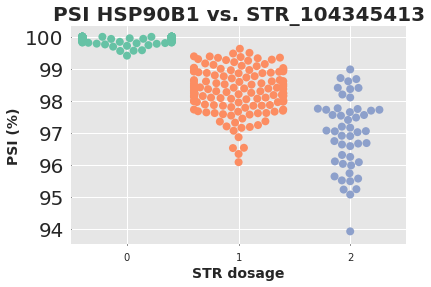

ENSG00000125991.14_4
STR_34133318

ERGIC3
ERGIC and golgi 3
Distance between STR and exon
1660.0
2.148021662811892e-75


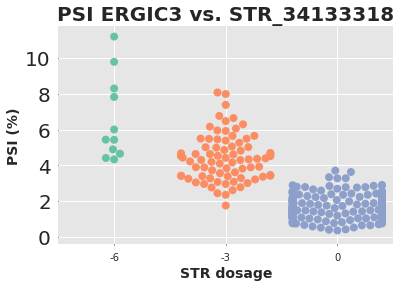

ENSG00000221923.4_4
STR_52882476

ZNF880
zinc finger protein 880
Distance between STR and exon
198.0
2.5539352830648838e-54


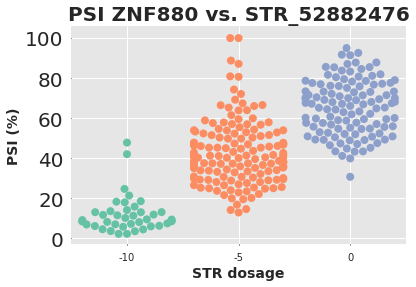

ENSG00000173272.9_3
STR_132232700

MZT2A
mitotic spindle organizing protein 2A
Distance between STR and exon
8831.0
1.0088787035242122e-48


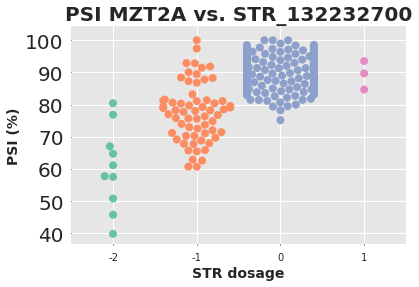

ENSG00000106100.6_14
STR_30503323

NOD1
nucleotide binding oligomerization domain containing 1
Distance between STR and exon
9.0
4.632188846721094e-48


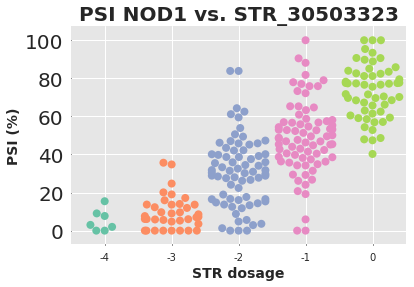

ENSG00000129562.6_2
STR_23042082

DAD1
defender against cell death 1
Distance between STR and exon
1877.0
4.3403374709484384e-43


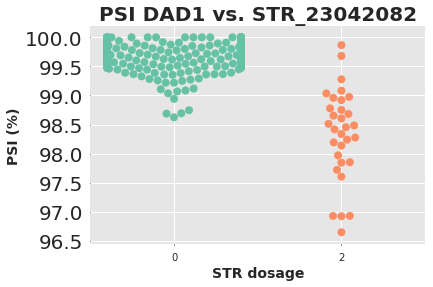

ENSG00000116791.9_4
STR_75182917

CRYZ
crystallin zeta
Distance between STR and exon
1976.0
1.060950101944166e-42


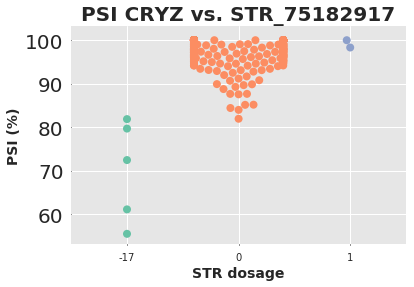

ENSG00000104490.13_12
STR_102896927

NCALD
neurocalcin delta
Distance between STR and exon
2442.0
2.6445662324862763e-39


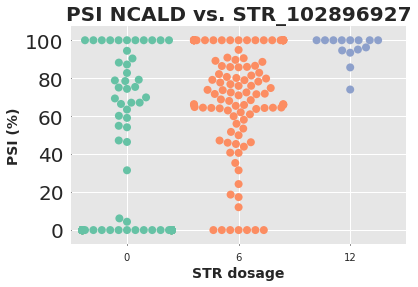

ENSG00000089127.8_5
STR_113362272

OAS1
2'-5'-oligoadenylate synthetase 1
Distance between STR and exon
5257.0
8.148718969910223e-39


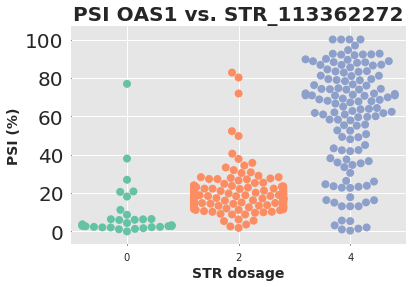

ENSG00000109184.10_3
STR_52716000

DCUN1D4
defective in cullin neddylation 1 domain containing 4
Distance between STR and exon
1467.0
1.8044380027320654e-38


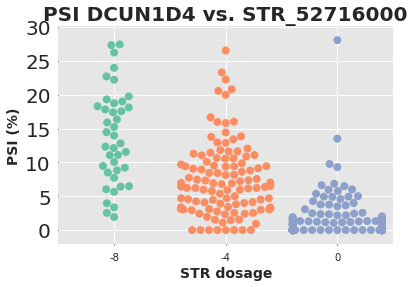

ENSG00000184584.8_1
STR_138847545

TMEM173
transmembrane protein 173
Distance between STR and exon
9369.0
3.626862119814608e-38


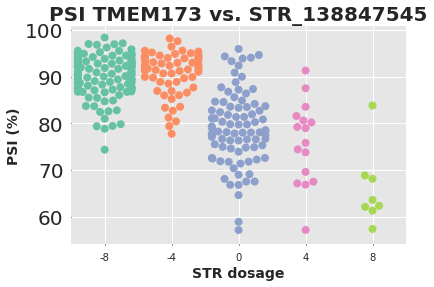

ENSG00000163319.6_3
STR_84382059

MRPS18C
mitochondrial ribosomal protein S18C
Distance between STR and exon
1109.0
1.1568701302219963e-37


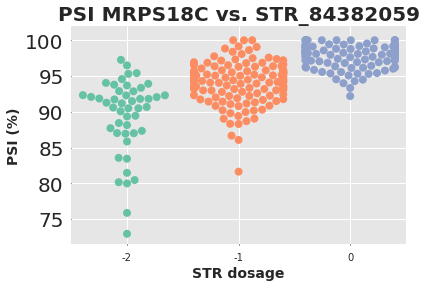

ENSG00000197142.6_22
STR_114191495

ACSL5
acyl-CoA synthetase long chain family member 5
Distance between STR and exon
4878.0
4.5782493042717425e-35


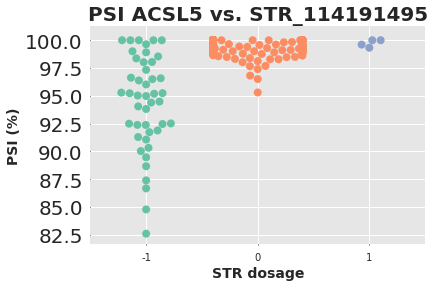

ENSG00000105341.14_1
STR_41945123

DMAC2
distal membrane arm assembly complex 2
Distance between STR and exon
5784.0
4.6227207201271986e-35


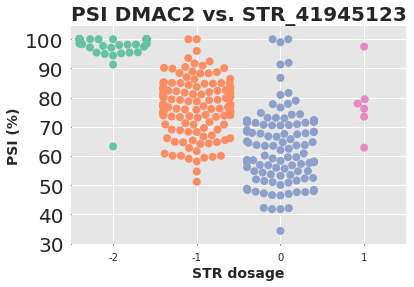

ENSG00000154263.13_17
STR_67180975

ABCA10
ATP binding cassette subfamily A member 10
Distance between STR and exon
5826.0
5.781616431942442e-34


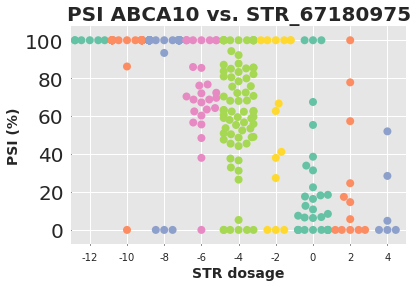

ENSG00000120306.5_1
STR_139582563

CYSTM1
cysteine rich transmembrane module containing 1
Distance between STR and exon
8326.0
2.808188117880757e-33


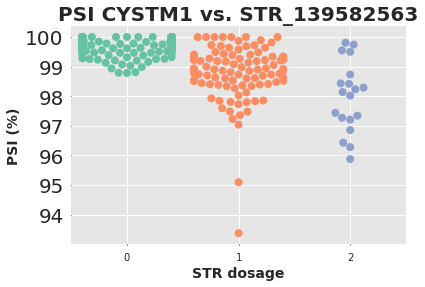

ENSG00000105136.15_0
STR_58009780

ZNF419
zinc finger protein 419
Distance between STR and exon
8227.0
1.045825976347162e-32


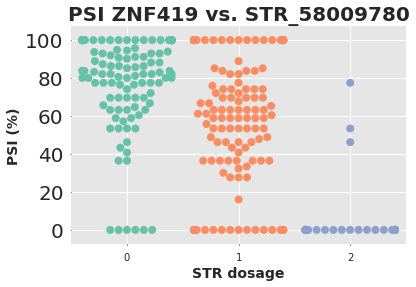

ENSG00000106603.13_8
STR_43696420

COA1
cytochrome c oxidase assembly factor 1 homolog
Distance between STR and exon
668.0
5.477857882131899e-32


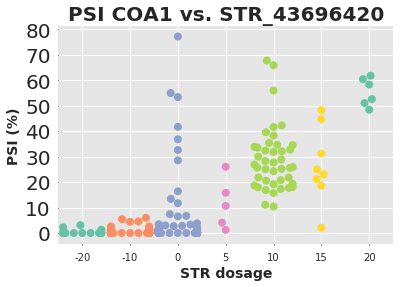

ENSG00000163162.4_1
STR_101896639

RNF149
ring finger protein 149
Distance between STR and exon
7241.0
1.030617188435101e-31


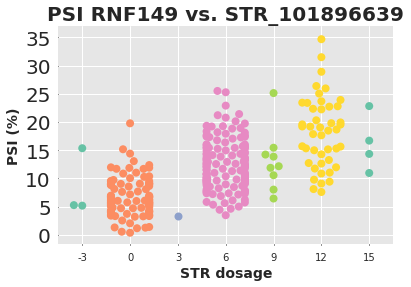

ENSG00000173915.8_2
STR_105146732

ATP5MD
ATP synthase membrane subunit DAPIT
Distance between STR and exon
7224.0
1.418393188962671e-29


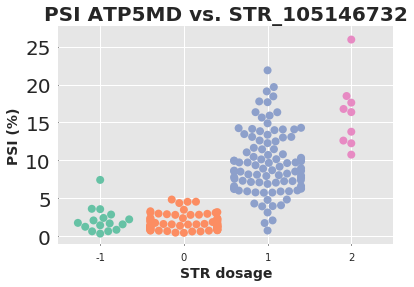

ENSG00000112964.9_6
STR_42634624

GHR
growth hormone receptor
Distance between STR and exon
5419.0
3.362837426044348e-29


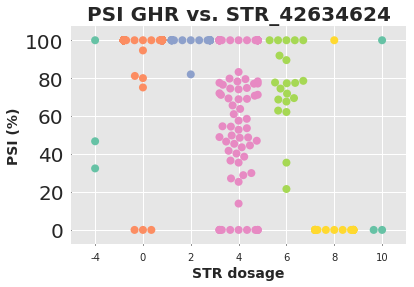

ENSG00000104714.9_3
STR_585102

ERICH1
glutamate rich 1
Distance between STR and exon
5481.0
6.584451497484626e-29


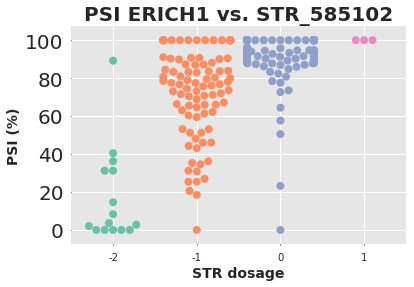

ENSG00000141562.13_3
STR_80417741

NARF
nuclear prelamin A recognition factor
Distance between STR and exon
417.0
1.1604288470583522e-28


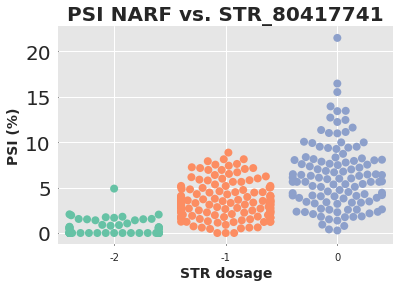

ENSG00000163932.9_5
STR_53213816

PRKCD
protein kinase C delta
Distance between STR and exon
6192.0
1.2732586174817222e-28


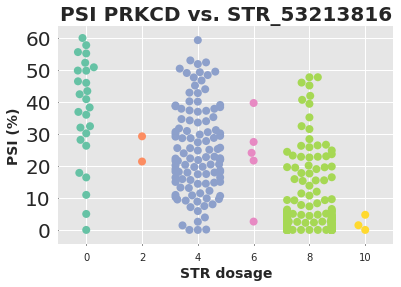

ENSG00000198431.11_10
STR_104676398

TXNRD1
thioredoxin reductase 1
Distance between STR and exon
8373.0
1.686484466433796e-28


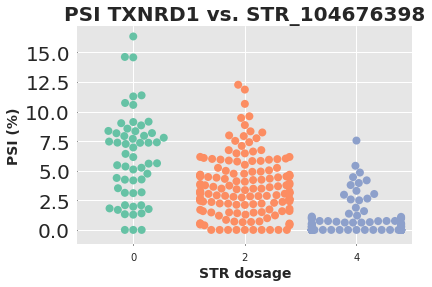

ENSG00000120071.8_13
STR_44238802

KANSL1
KAT8 regulatory NSL complex subunit 1
Distance between STR and exon
8470.0
2.23268730036129e-28


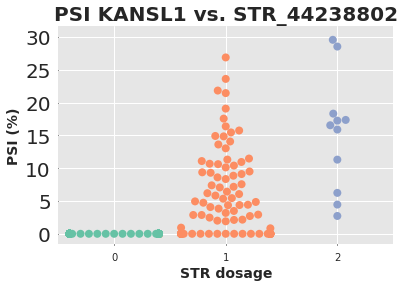

ENSG00000073605.14_5
STR_38063985

GSDMB
gasdermin B
Distance between STR and exon
444.0
1.2931940639016688e-27


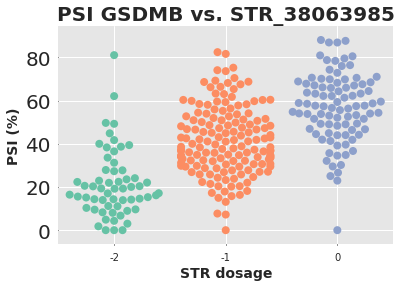

ENSG00000168961.12_4
STR_25974601

LGALS9
galectin 9
Distance between STR and exon
2226.0
2.6564047777040772e-27


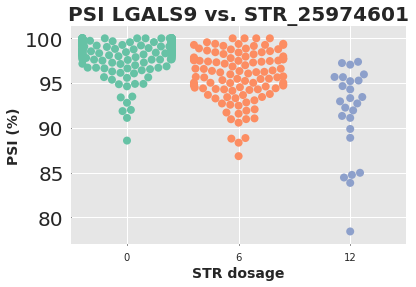

ENSG00000059378.8_3
STR_139736623

PARP12
poly(ADP-ribose) polymerase family member 12
Distance between STR and exon
9417.0
3.0593476817995516e-27


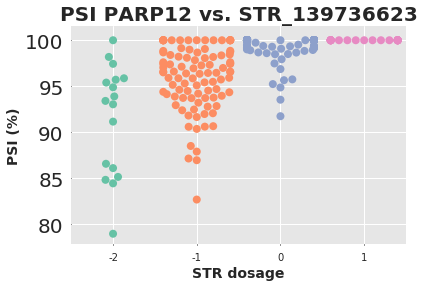

ENSG00000145476.11_8
STR_187125190

CYP4V2
cytochrome P450 family 4 subfamily V member 2
Distance between STR and exon
801.0
5.679325724862329e-27


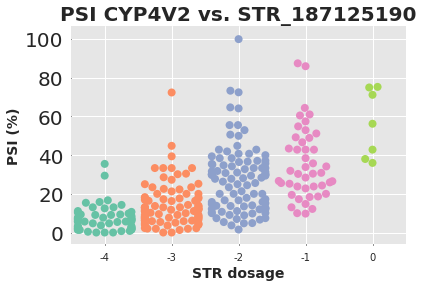

ENSG00000140105.13_16
STR_100837120

WARS
tryptophanyl-tRNA synthetase
Distance between STR and exon
3353.0
1.1274457207934591e-26


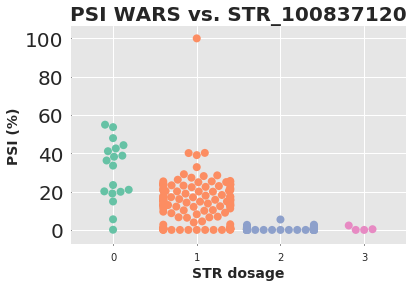

ENSG00000169087.6_7
STR_122479391

HSPBAP1
HSPB1 associated protein 1
Distance between STR and exon
990.0
2.269333893635143e-26


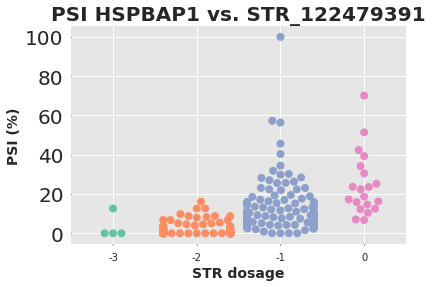

ENSG00000156170.8_13
STR_96047476

NDUFAF6
NADH:ubiquinone oxidoreductase complex assembly factor 6
Distance between STR and exon
525.0
3.716327595649996e-26


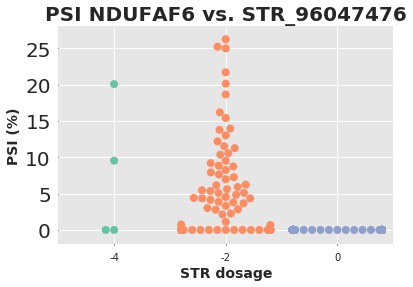

ENSG00000163702.14_3
STR_9962768

IL17RC
interleukin 17 receptor C
Distance between STR and exon
2675.0
4.483016280031308e-26


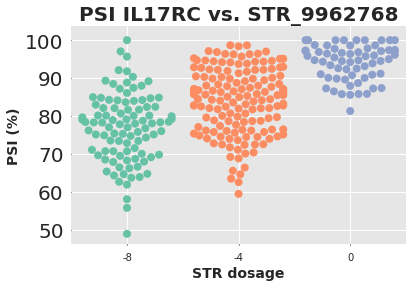

ENSG00000141698.12_2
STR_39982464

NT5C3B
5'-nucleotidase, cytosolic IIIB
Distance between STR and exon
2110.0
8.702588814650648e-26


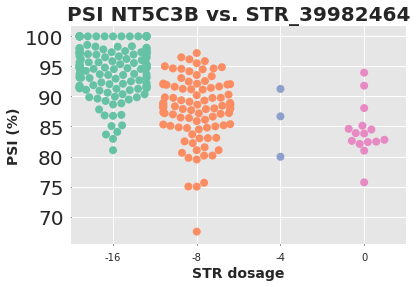

ENSG00000100296.9_13
STR_29918352

THOC5
THO complex 5
Distance between STR and exon
8715.0
1.4501571064822822e-25


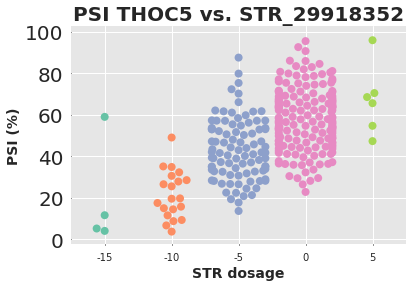

ENSG00000035115.17_3
STR_227890

SH3YL1
SH3 and SYLF domain containing 1
Distance between STR and exon
2970.0
1.3995833156530012e-24


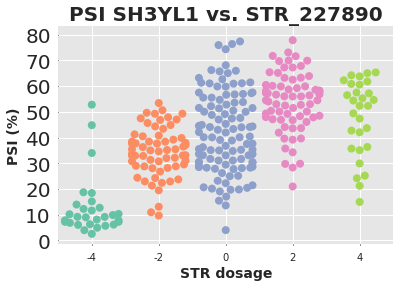

ENSG00000144559.6_11
STR_11884170

TAMM41
TAM41 mitochondrial translocator assembly and maintenance homolog
Distance between STR and exon
2195.0
1.949300424755158e-24


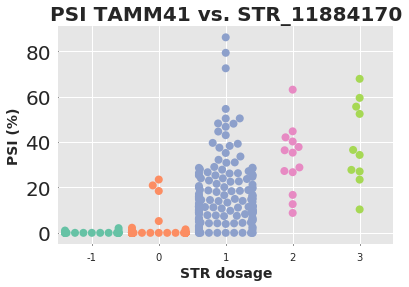

ENSG00000121716.14_12
STR_99953787

PILRB
paired immunoglobin-like type 2 receptor beta
Distance between STR and exon
1216.0
3.394418341830755e-24


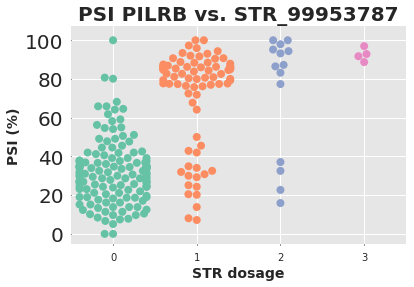

ENSG00000206530.4_0
STR_113019319

CFAP44
cilia and flagella associated protein 44
Distance between STR and exon
6434.0
3.5082595839908306e-24


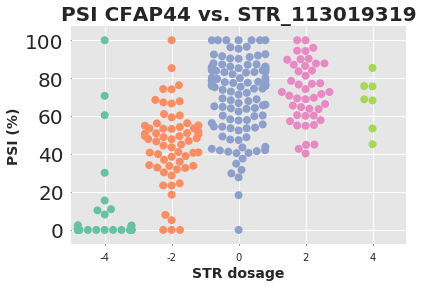

ENSG00000001460.13_6
STR_24717231

STPG1
sperm tail PG-rich repeat containing 1
Distance between STR and exon
462.0
5.540618503642652e-24


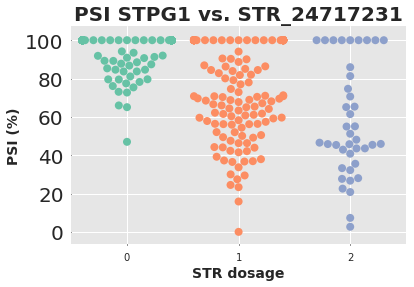

ENSG00000106603.13_9
STR_43696420

COA1
cytochrome c oxidase assembly factor 1 homolog
Distance between STR and exon
395.0
8.675514297252598e-24


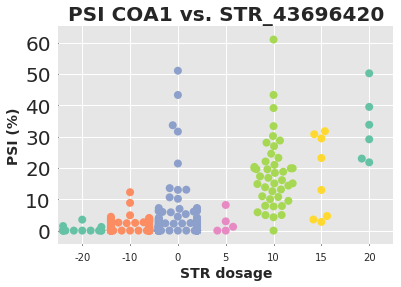

ENSG00000197912.9_25
STR_89617474

SPG7
SPG7, paraplegin matrix AAA peptidase subunit
Distance between STR and exon
4798.0
4.591112773538351e-23


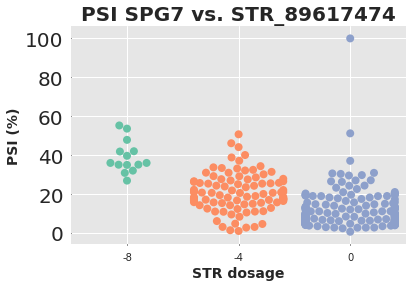

ENSG00000023191.12_10
STR_514581

RNH1
ribonuclease/angiogenin inhibitor 1
Distance between STR and exon
9585.0
5.436387079044443e-23


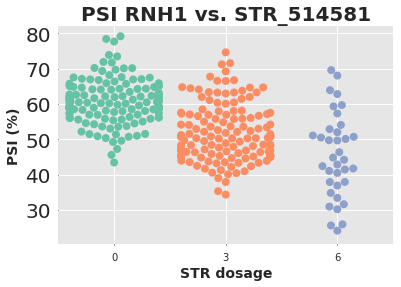

ENSG00000183160.8_1
STR_108995739

TMEM119
transmembrane protein 119
Distance between STR and exon
7418.0
5.758229741993603e-23


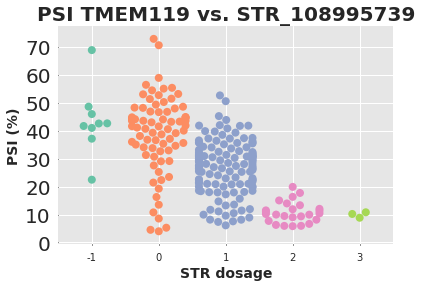

ENSG00000134759.9_7
STR_33727371

ELP2
elongator acetyltransferase complex subunit 2
Distance between STR and exon
7795.0
1.116199448967515e-22


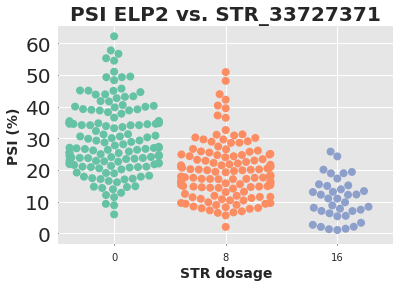

ENSG00000143951.11_7
STR_63578112

WDPCP
WD repeat containing planar cell polarity effector
Distance between STR and exon
8818.0
2.3915307802526977e-22


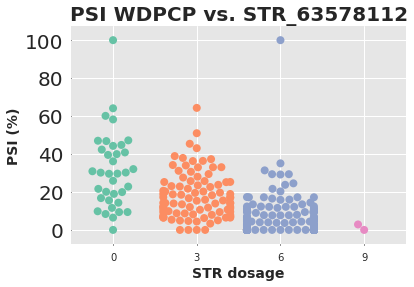

ENSG00000168385.13_1
STR_242250070

SEPT2
septin 2
Distance between STR and exon
5348.0
1.156577225188529e-21


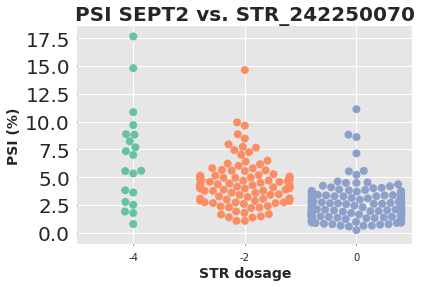

ENSG00000124588.15_11
STR_3011187

NQO2
N-ribosyldihydronicotinamide:quinone reductase 2
Distance between STR and exon
4577.0
3.41919491074442e-21


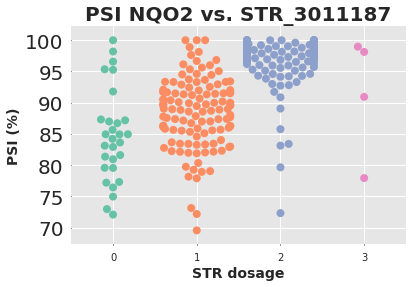

ENSG00000162929.9_29
STR_61381024

KIAA1841
KIAA1841
Distance between STR and exon
3973.0
3.8651898619441935e-21


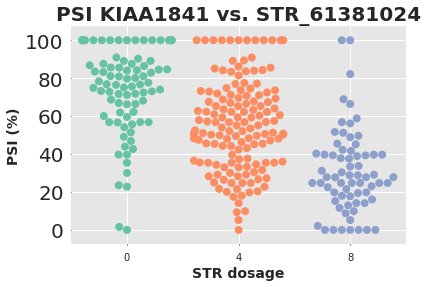

ENSG00000176155.14_20
STR_80152186

CCDC57
coiled-coil domain containing 57
Distance between STR and exon
9138.0
5.363422761873611e-21


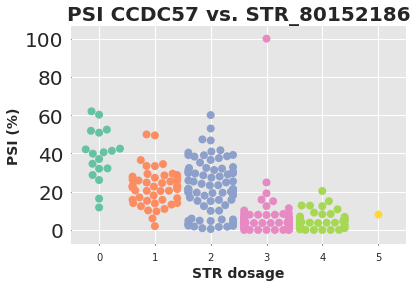

ENSG00000117226.7_3
STR_89467154

GBP3
guanylate binding protein 3
Distance between STR and exon
9433.0
6.6380572403066424e-21


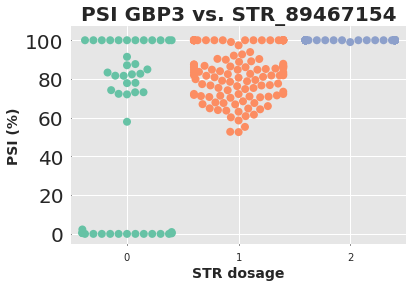

ENSG00000172243.13_2
STR_10275994

CLEC7A
C-type lectin domain containing 7A
Distance between STR and exon
1692.0
2.5206123969543408e-20


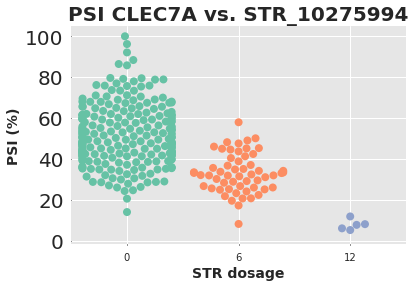

ENSG00000140374.11_16
STR_76594046

ETFA
electron transfer flavoprotein subunit alpha
Distance between STR and exon
8227.0
4.4644124207864435e-20


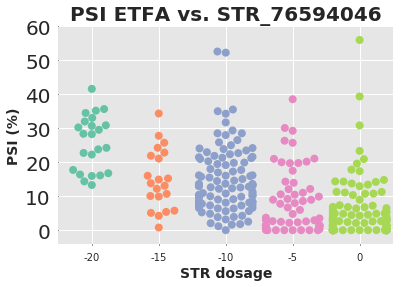

ENSG00000136098.12_5
STR_52707752

NEK3
NIMA related kinase 3
Distance between STR and exon
7404.0
9.090873452637532e-20


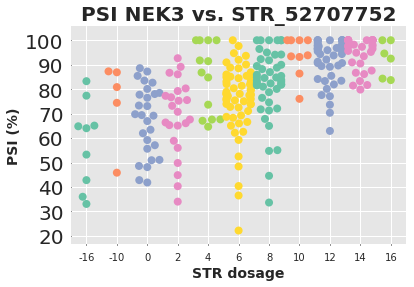

ENSG00000105136.15_1
STR_58009217

ZNF419
zinc finger protein 419
Distance between STR and exon
5373.0
1.350824026453717e-19


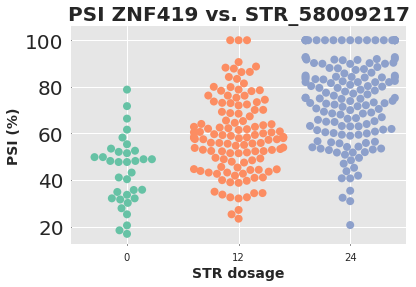

ENSG00000117481.6_1
STR_46819783

NSUN4
NOP2/Sun RNA methyltransferase family member 4
Distance between STR and exon
9817.0
1.927009218578745e-19


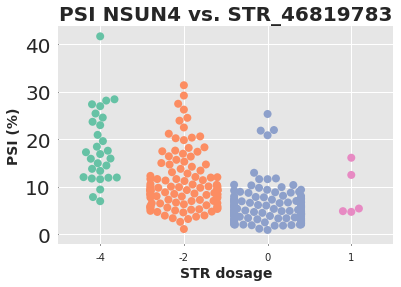

ENSG00000215790.2_7
STR_1684348

SLC35E2A
solute carrier family 35 member E2A
Distance between STR and exon
8241.0
7.703023653371419e-19


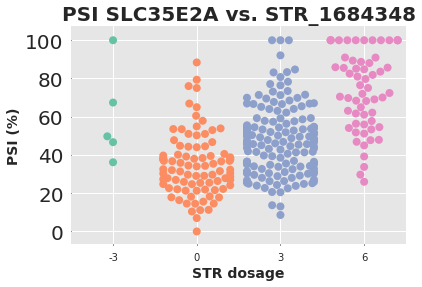

ENSG00000135506.11_2
STR_58095567

OS9
OS9, endoplasmic reticulum lectin
Distance between STR and exon
6107.0
8.88044636169405e-19


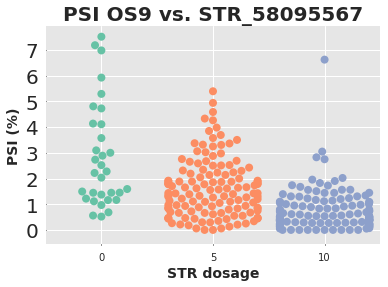

ENSG00000153093.14_16
STR_111721143

ACOXL
acyl-CoA oxidase like
Distance between STR and exon
58.0
3.2957277184653085e-18


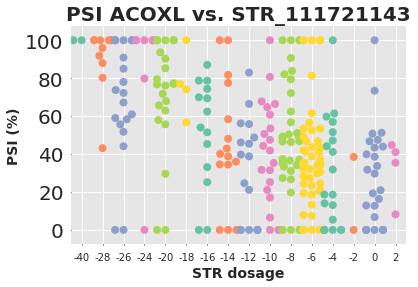

ENSG00000166347.14_3
STR_71934073

CYB5A
cytochrome b5 type A
Distance between STR and exon
5894.0
4.2811787677384896e-18


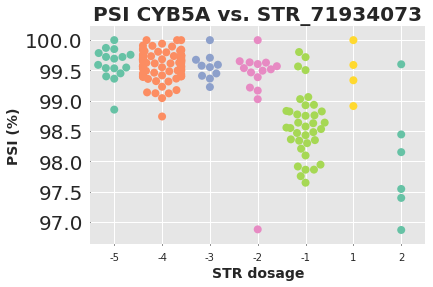

ENSG00000106617.9_16
STR_151424302

PRKAG2
protein kinase AMP-activated non-catalytic subunit gamma 2
Distance between STR and exon
7032.0
4.2811787677384896e-18


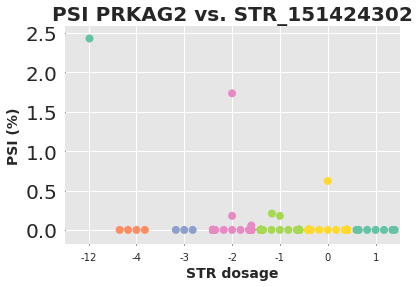

ENSG00000121350.11_9
STR_21617659

PYROXD1
pyridine nucleotide-disulphide oxidoreductase domain 1
Distance between STR and exon
7639.0
2.02606348967114e-17


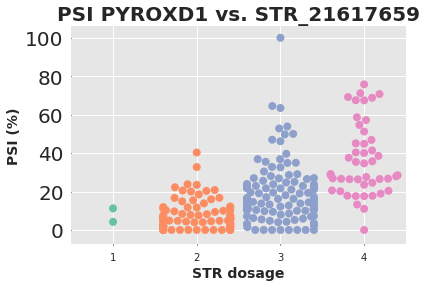

ENSG00000103121.4_5
STR_81028038

CMC2
C-X9-C motif containing 2
Distance between STR and exon
5837.0
2.244173338740188e-17


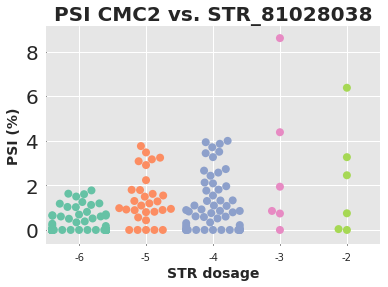

ENSG00000141562.13_2
STR_80417741

NARF
nuclear prelamin A recognition factor
Distance between STR and exon
742.0
2.2549210770350165e-17


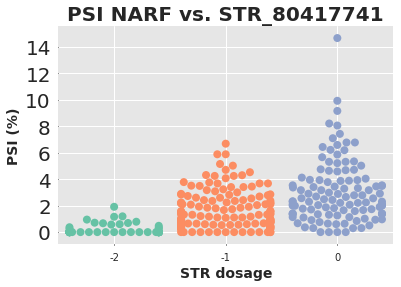

ENSG00000100376.7_10
STR_45724514

FAM118A
family with sequence similarity 118 member A
Distance between STR and exon
1002.0
3.582525928532081e-17


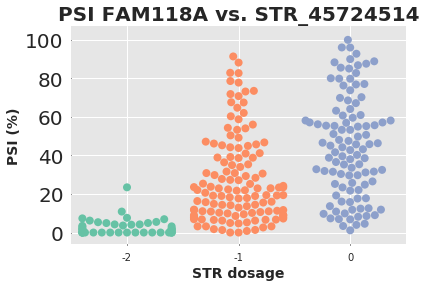

ENSG00000196683.6_2
STR_22853790

TOMM7
translocase of outer mitochondrial membrane 7
Distance between STR and exon
3829.0
8.197188687839565e-17


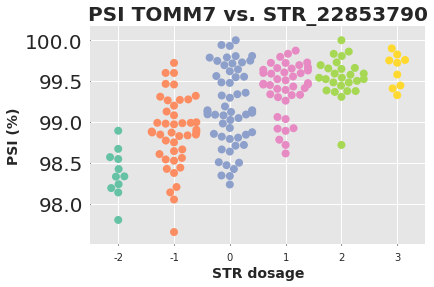

ENSG00000117226.7_4
STR_89475808

GBP3
guanylate binding protein 3
Distance between STR and exon
1622.0
1.3262978273610616e-16


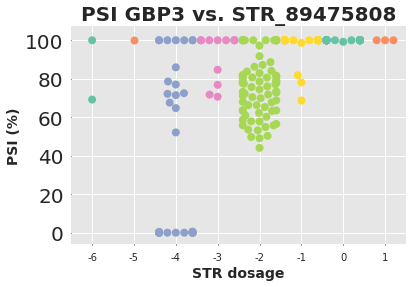

ENSG00000221887.4_1
STR_61624542

HMSD
histocompatibility minor serpin domain containing
Distance between STR and exon
3781.0
1.637068445518646e-16


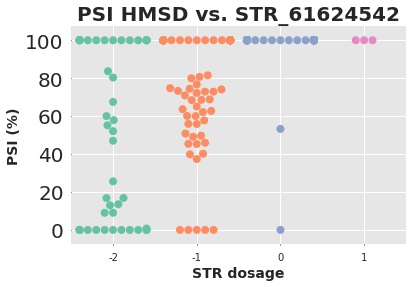

ENSG00000134058.6_2
STR_68542536

CDK7
cyclin dependent kinase 7
Distance between STR and exon
4036.0
1.697492983943919e-16


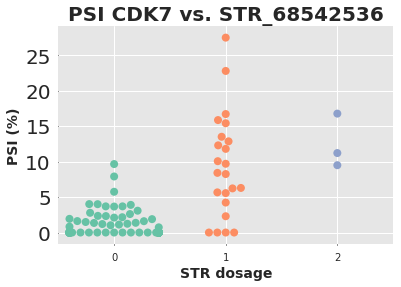

ENSG00000105383.10_1
STR_51731925

CD33
CD33 molecule
Distance between STR and exon
3071.0
1.7421686947771605e-16


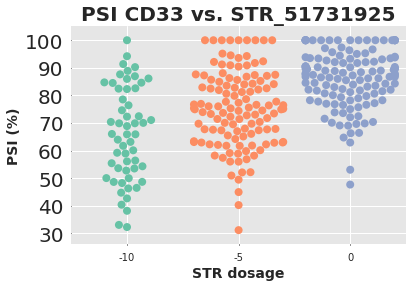

ENSG00000003756.12_15
STR_50143552

RBM5
RNA binding motif protein 5
Distance between STR and exon
5945.0
3.453239784312369e-16


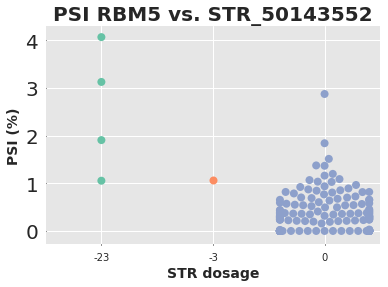

ENSG00000130429.8_3
STR_98969675

ARPC1B
actin related protein 2/3 complex subunit 1B
Distance between STR and exon
5282.0
3.4912841066387236e-16


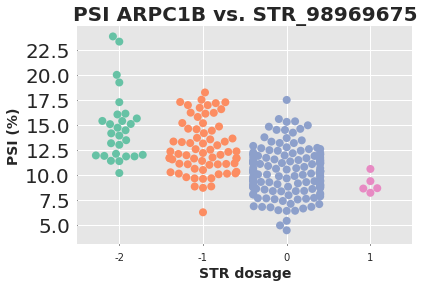

ENSG00000007341.14_1
STR_113085370

ST7L
suppression of tumorigenicity 7 like
Distance between STR and exon
1876.0
3.78392859884216e-16


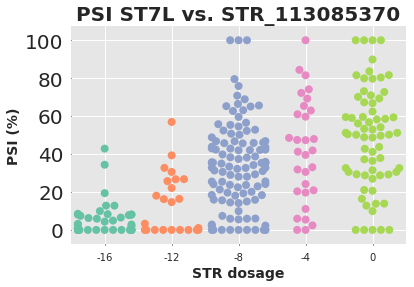

ENSG00000071282.7_1
STR_8566368

LMCD1
LIM and cysteine rich domains 1
Distance between STR and exon
9687.0
4.460886657511473e-16


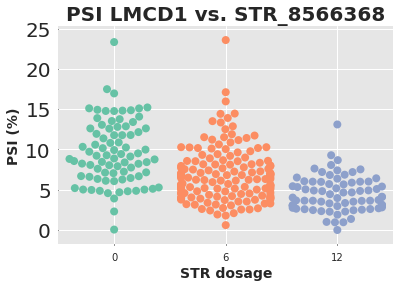

ENSG00000147408.10_5
STR_19312301

CSGALNACT1
chondroitin sulfate N-acetylgalactosaminyltransferase 1
Distance between STR and exon
2740.0
5.092858541674661e-16


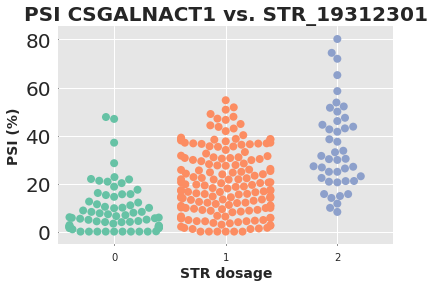

ENSG00000184497.8_3
STR_114462509

TMEM255B
transmembrane protein 255B
Distance between STR and exon
9351.0
5.258117874675867e-16


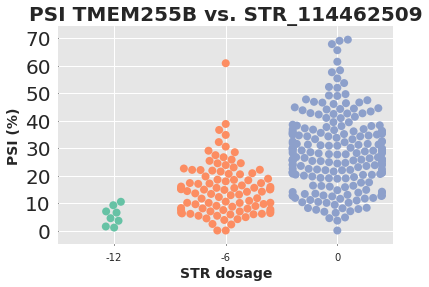

ENSG00000176155.14_4
STR_80075620

CCDC57
coiled-coil domain containing 57
Distance between STR and exon
8790.0
7.395018930944474e-16


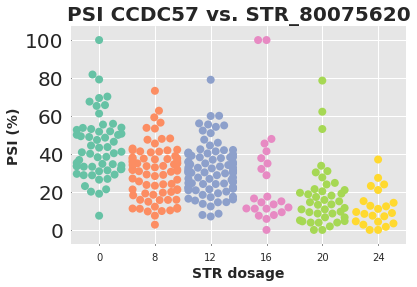

ENSG00000071082.6_2
STR_101629088

RPL31
ribosomal protein L31
Distance between STR and exon
5233.0
8.148451226303889e-16


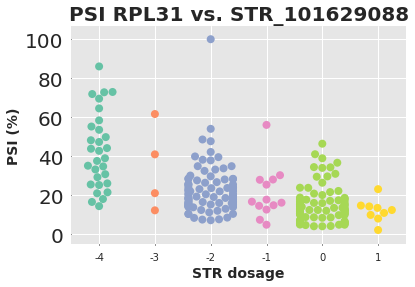

ENSG00000219626.4_10
STR_24389366

FAM228B
family with sequence similarity 228 member B
Distance between STR and exon
1130.0
1.7050987410728227e-15


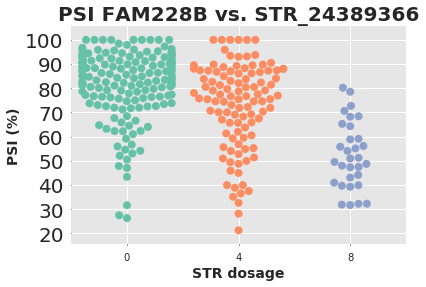

ENSG00000115841.15_5
STR_38183787

RMDN2
regulator of microtubule dynamics 2
Distance between STR and exon
3534.0
2.100939181482345e-15


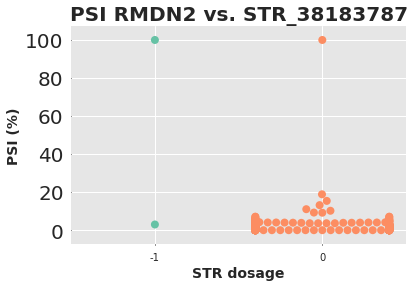

ENSG00000119943.6_17
STR_100169836

PYROXD2
pyridine nucleotide-disulphide oxidoreductase domain 2
Distance between STR and exon
3869.0
4.3673171447777225e-15


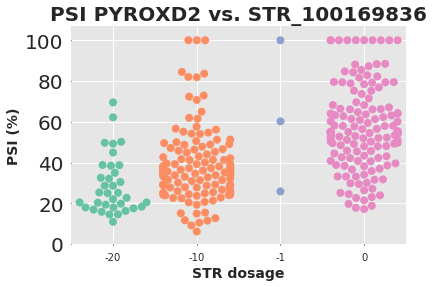

ENSG00000131236.12_2
STR_40507701

CAP1
cyclase associated actin cytoskeleton regulatory protein 1
Distance between STR and exon
536.0
5.205284141819222e-15


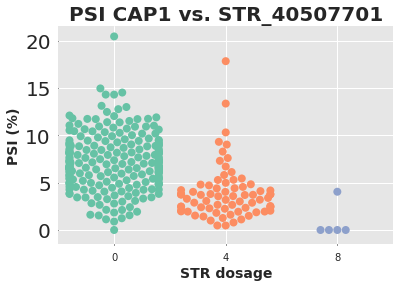

ENSG00000163811.7_17
STR_29169154

WDR43
WD repeat domain 43
Distance between STR and exon
8294.0
5.488067478789124e-15


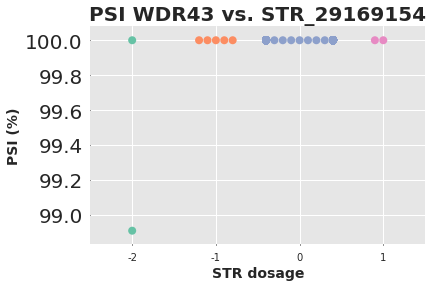

ENSG00000141179.9_6
STR_53869678

PCTP
phosphatidylcholine transfer protein
Distance between STR and exon
4663.0
9.047281928670022e-15


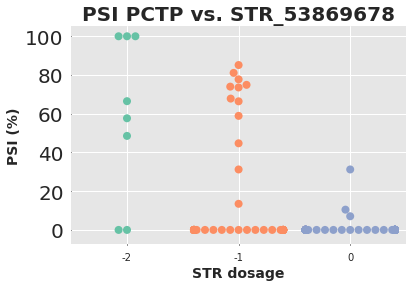

ENSG00000104388.10_4
STR_61489602

RAB2A
RAB2A, member RAS oncogene family
Distance between STR and exon
746.0
9.714349941130258e-15


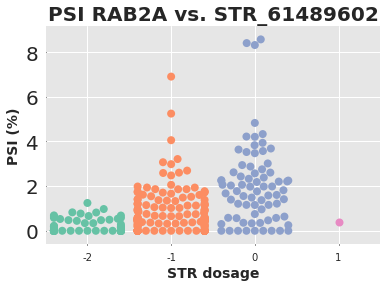

ENSG00000130844.12_2
STR_54032044

ZNF331
zinc finger protein 331
Distance between STR and exon
5275.0
1.1994290485475157e-14


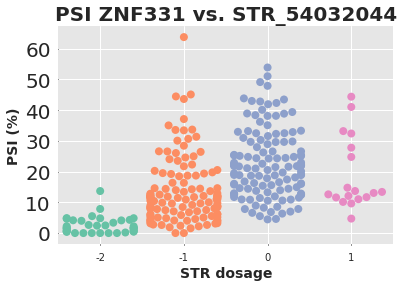

ENSG00000141556.16_44
STR_80898835

TBCD
tubulin folding cofactor D
Distance between STR and exon
3599.0
1.6611190510128818e-14


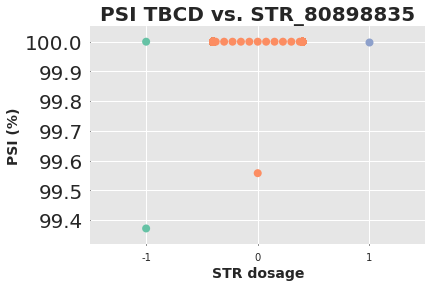

ENSG00000104714.9_4
STR_585102

ERICH1
glutamate rich 1
Distance between STR and exon
6012.0
1.7410732461697347e-14


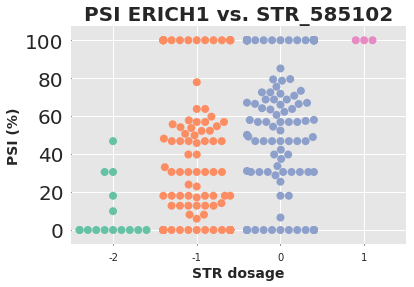

ENSG00000167065.9_2
STR_31053264

DUSP18
dual specificity phosphatase 18
Distance between STR and exon
7678.0
1.9753032953175316e-14


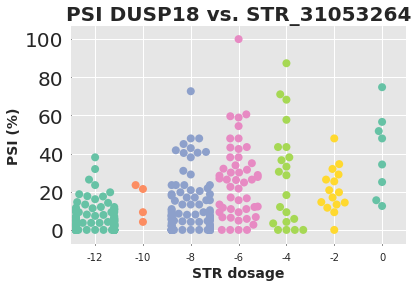

ENSG00000177479.15_7
STR_48986547

ARIH2
ariadne RBR E3 ubiquitin protein ligase 2
Distance between STR and exon
18.0
2.3020715970499742e-14


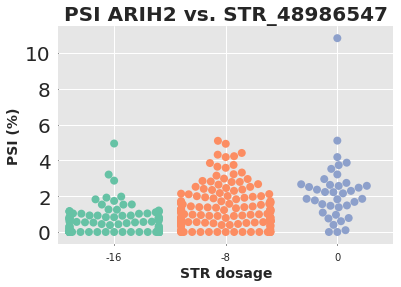

ENSG00000066427.17_11
STR_92557796

ATXN3
ataxin 3
Distance between STR and exon
2100.0
2.4530071382874714e-14


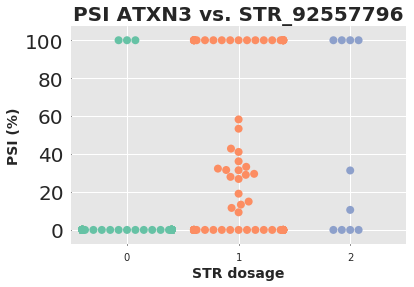

ENSG00000066405.8_3
STR_137751331

CLDN18
claudin 18
Distance between STR and exon
7765.0
2.5145469272640897e-14


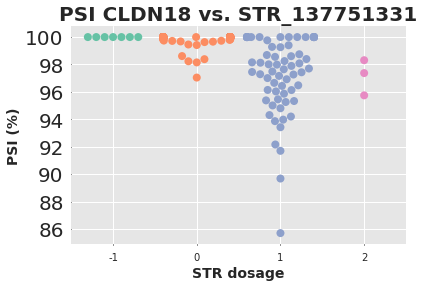

ENSG00000100461.13_8
STR_23371266

RBM23
RNA binding motif protein 23
Distance between STR and exon
3549.0
2.6181677091832683e-14


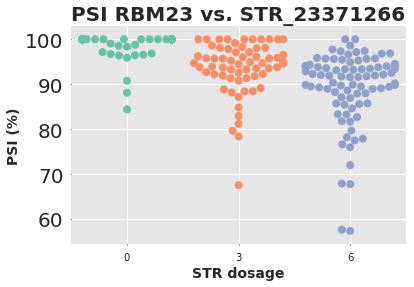

ENSG00000139433.5_3
STR_110286590

GLTP
glycolipid transfer protein
Distance between STR and exon
9070.0
4.4800273700008697e-14


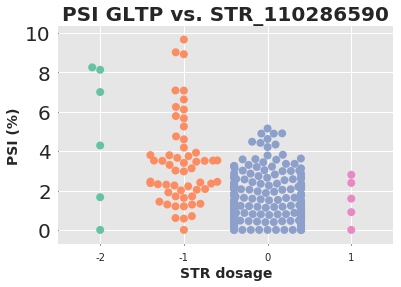

ENSG00000198466.8_0
STR_58358359

ZNF587
zinc finger protein 587
Distance between STR and exon
6785.0
4.505735168468141e-14


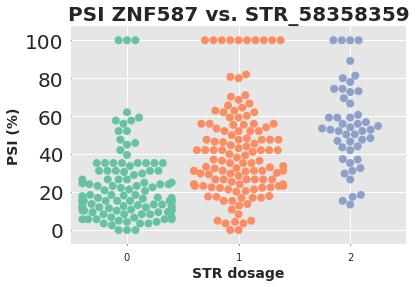

ENSG00000147576.11_13
STR_67381670

ADHFE1
alcohol dehydrogenase, iron containing 1
Distance between STR and exon
528.0
7.948513407930902e-14


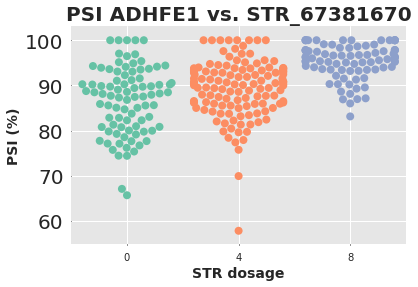

ENSG00000164120.9_3
STR_175425966

HPGD
15-hydroxyprostaglandin dehydrogenase
Distance between STR and exon
1928.0
1.0208469038194234e-13


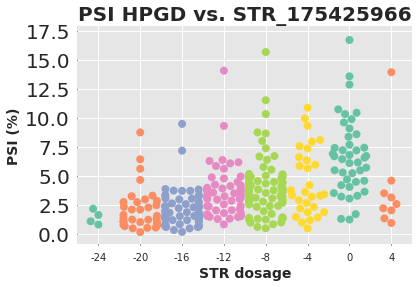

ENSG00000130702.9_62
STR_60916096

LAMA5
laminin subunit alpha 5
Distance between STR and exon
4054.0
1.3082266185750471e-13


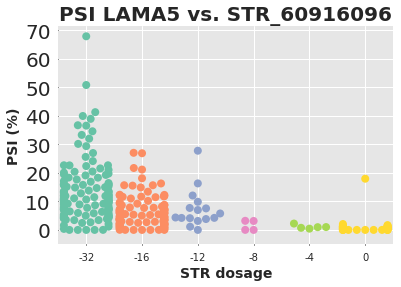

ENSG00000235750.5_4
STR_175163249

KIAA0040
KIAA0040
Distance between STR and exon
1320.0
1.337227376460671e-13


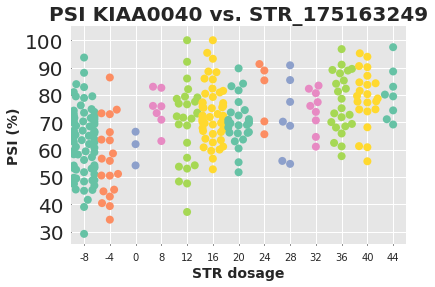

ENSG00000178053.13_3
STR_158306390

MLF1
myeloid leukemia factor 1
Distance between STR and exon
251.0
1.4000376786473218e-13


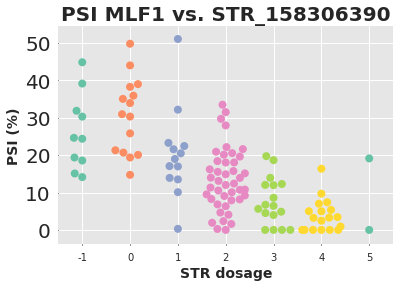

ENSG00000131100.8_7
STR_18101448

ATP6V1E1
ATPase H+ transporting V1 subunit E1
Distance between STR and exon
352.0
1.575215711987129e-13


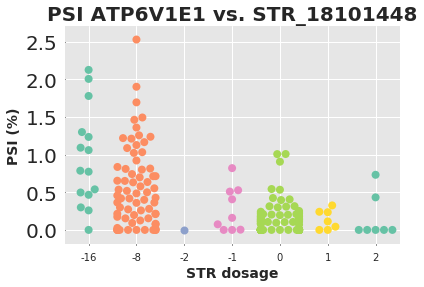

ENSG00000176623.7_1
STR_87477150

RMDN1
regulator of microtubule dynamics 1
Distance between STR and exon
7427.0
1.7560090372025177e-13


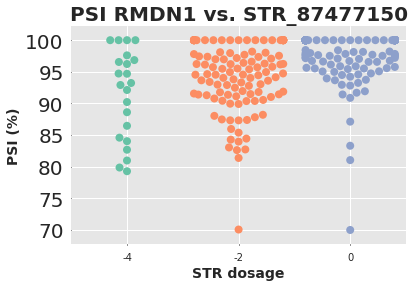

ENSG00000120008.11_14
STR_122648751

WDR11
WD repeat domain 11
Distance between STR and exon
8677.0
1.9874253337975316e-13


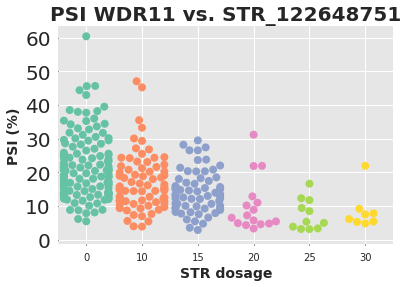

ENSG00000164308.12_13
STR_96246158

ERAP2
endoplasmic reticulum aminopeptidase 2
Distance between STR and exon
7638.0
2.1728071043219086e-13


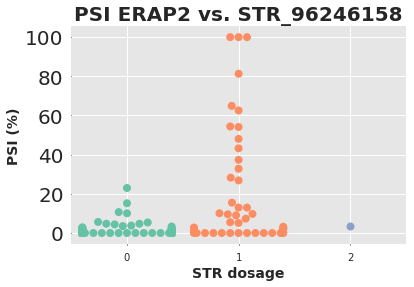

ENSG00000100997.14_1
STR_25278666

ABHD12
abhydrolase domain containing 12
Distance between STR and exon
2168.0
2.2139250180984405e-13


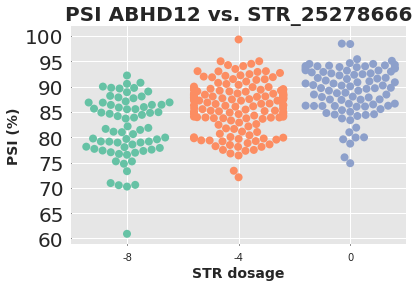

ENSG00000188227.8_1
STR_38005461

ZNF793
zinc finger protein 793
Distance between STR and exon
7512.0
3.1541834466328836e-13


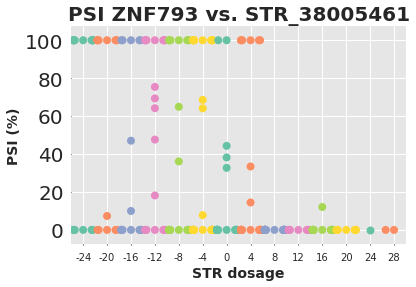

ENSG00000131374.10_10
STR_17378203

TBC1D5
TBC1 domain family member 5
Distance between STR and exon
678.0
3.2380722059423777e-13


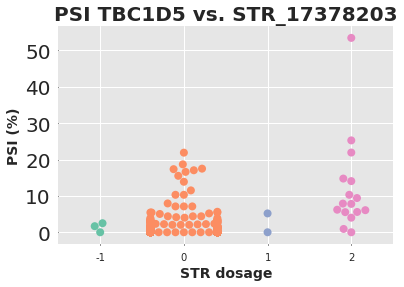

ENSG00000071082.6_3
STR_101625869

RPL31
ribosomal protein L31
Distance between STR and exon
9591.0
3.3229758936793496e-13


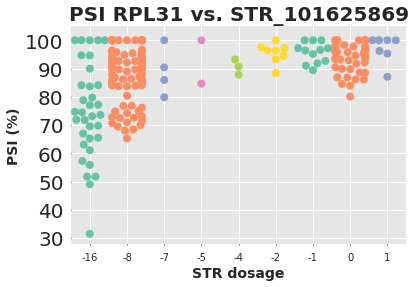

ENSG00000121417.9_5
STR_58148663

ZNF211
zinc finger protein 211
Distance between STR and exon
2617.0
3.592647396765689e-13


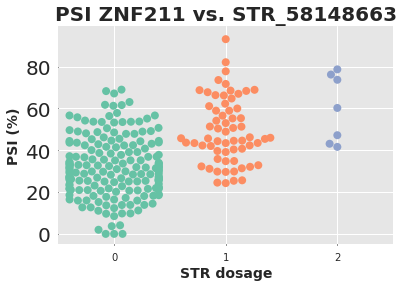

ENSG00000168439.12_9
STR_63956831

STIP1
stress induced phosphoprotein 1
Distance between STR and exon
8134.0
3.592647396765689e-13


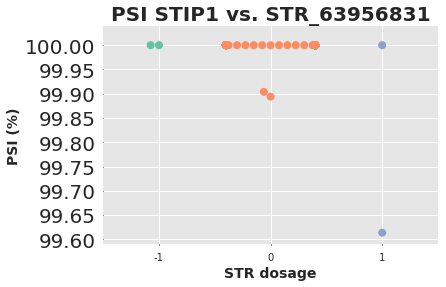

ENSG00000134184.8_6
STR_110240544

GSTM1
glutathione S-transferase mu 1
Distance between STR and exon
7358.0
3.6934256852642565e-13


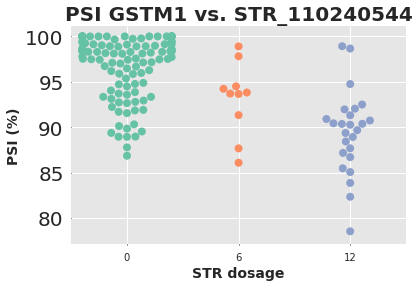

ENSG00000140988.11_3
STR_2010227

RPS2
ribosomal protein S2
Distance between STR and exon
3427.0
4.453874801780262e-13


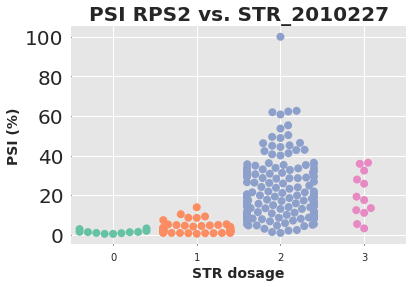

ENSG00000168439.12_8
STR_63956831

STIP1
stress induced phosphoprotein 1
Distance between STR and exon
7912.0
4.937383984284953e-13


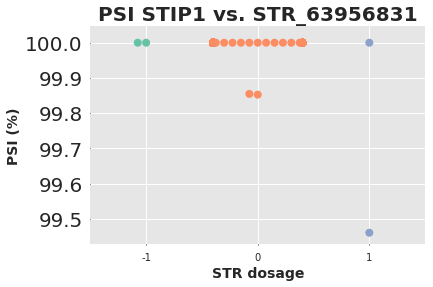

ENSG00000116221.11_7
STR_54687376

MRPL37
mitochondrial ribosomal protein L37
Distance between STR and exon
3325.0
6.663782105484196e-13


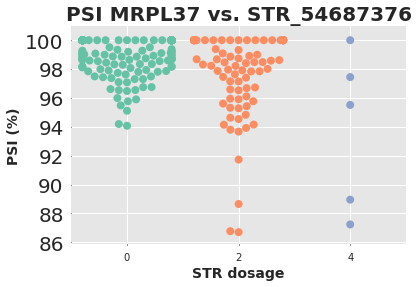

ENSG00000131876.12_7
STR_101832796

SNRPA1
small nuclear ribonucleoprotein polypeptide A'
Distance between STR and exon
2669.0
6.901823049775054e-13


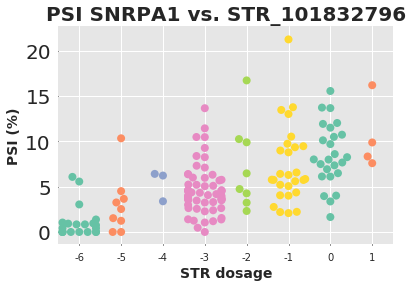

ENSG00000105792.15_23
STR_89929951

CFAP69
cilia and flagella associated protein 69
Distance between STR and exon
8626.0
8.789646607578451e-13


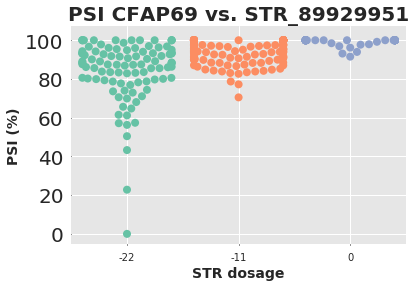

ENSG00000089041.12_7
STR_121603826

P2RX7
purinergic receptor P2X 7
Distance between STR and exon
35.0
1.0027364086341548e-12


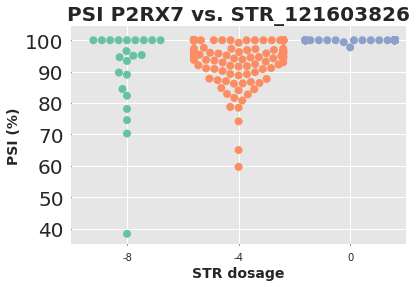

ENSG00000104408.5_11
STR_109253209

EIF3E
eukaryotic translation initiation factor 3 subunit E
Distance between STR and exon
7308.0
1.014657327275226e-12


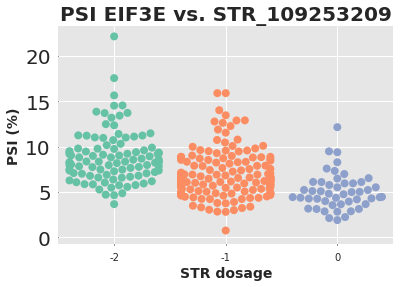

ENSG00000159063.8_1
STR_77822678

ALG8
ALG8, alpha-1,3-glucosyltransferase
Distance between STR and exon
8684.0
1.3301561590296826e-12


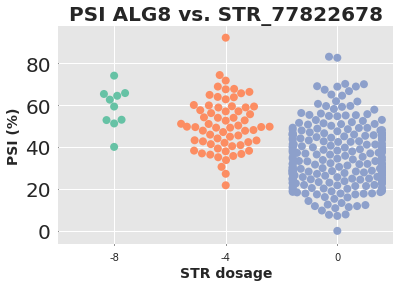

ENSG00000168439.12_10
STR_63956831

STIP1
stress induced phosphoprotein 1
Distance between STR and exon
8495.0
1.4479846166215588e-12


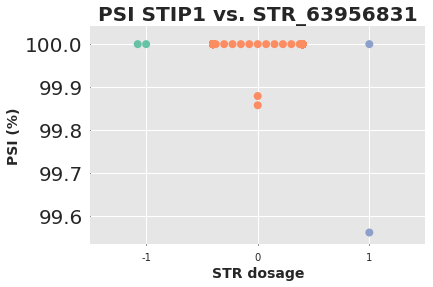

ENSG00000221947.3_4
STR_71598648

XKR9
XK related 9
Distance between STR and exon
5083.0
1.5692129674583545e-12


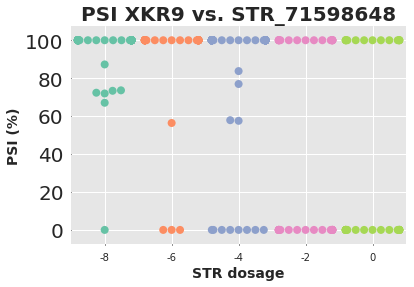

ENSG00000168439.12_6
STR_63956831

STIP1
stress induced phosphoprotein 1
Distance between STR and exon
6286.0
1.6316532059973913e-12


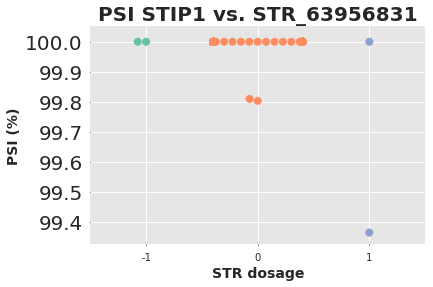

ENSG00000112685.9_24
STR_631544

EXOC2
exocyst complex component 2
Distance between STR and exon
1583.0
1.6723698915993688e-12


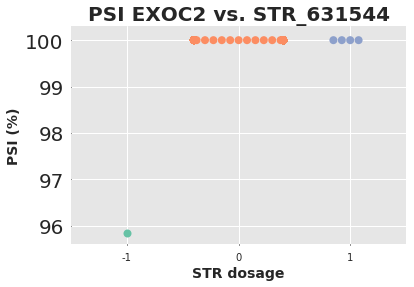

ENSG00000171130.13_5
STR_149574149

ATP6V0E2
ATPase H+ transporting V0 subunit e2
Distance between STR and exon
1618.0
1.949646997164795e-12


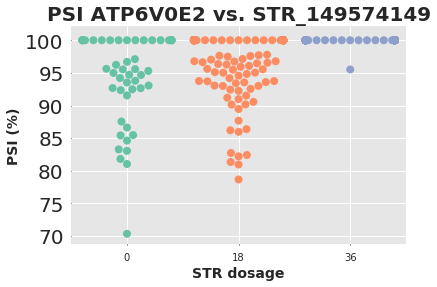

ENSG00000120913.19_2
STR_22433545

PDLIM2
PDZ and LIM domain 2
Distance between STR and exon
4119.0
2.1116515289253257e-12


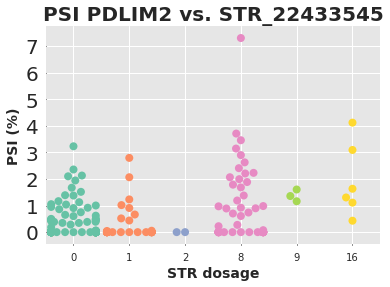

ENSG00000136436.10_2
STR_46916716

CALCOCO2
calcium binding and coiled-coil domain 2
Distance between STR and exon
22.0
2.1350428037190292e-12


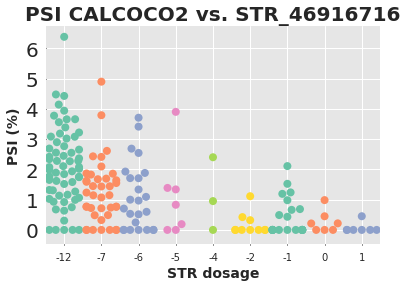

ENSG00000112685.9_26
STR_631544

EXOC2
exocyst complex component 2
Distance between STR and exon
6157.0
2.1433991375537763e-12


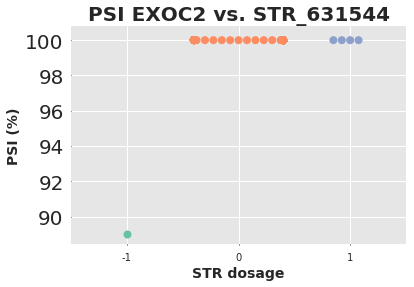

ENSG00000112685.9_25
STR_631544

EXOC2
exocyst complex component 2
Distance between STR and exon
1397.0
2.1433991375537763e-12


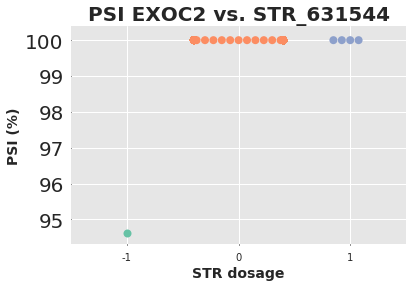

ENSG00000123643.8_12
STR_150848654

SLC36A1
solute carrier family 36 member 1
Distance between STR and exon
1738.0
2.368083020765106e-12


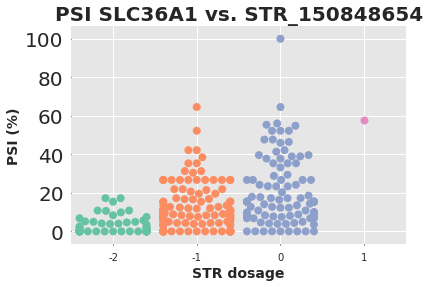

ENSG00000197912.9_14
STR_89599181

SPG7
SPG7, paraplegin matrix AAA peptidase subunit
Distance between STR and exon
3992.0
2.759930047380448e-12


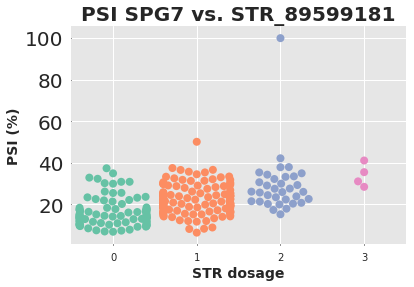

ENSG00000089063.10_3
STR_5092254

TMEM230
transmembrane protein 230
Distance between STR and exon
3.0
2.777961964123113e-12


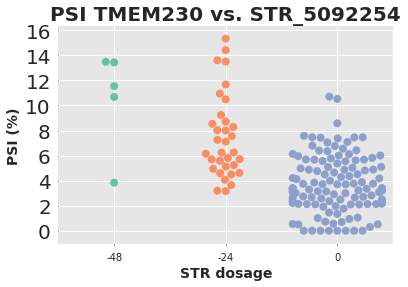

ENSG00000141504.7_2
STR_7526355

SAT2
spermidine/spermine N1-acetyltransferase family member 2
Distance between STR and exon
3906.0
7.932564763520098e-12


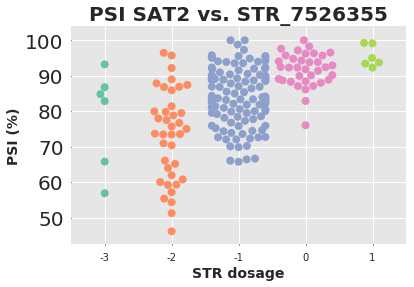

ENSG00000168439.12_5
STR_63956831

STIP1
stress induced phosphoprotein 1
Distance between STR and exon
5120.0
8.130931285550791e-12


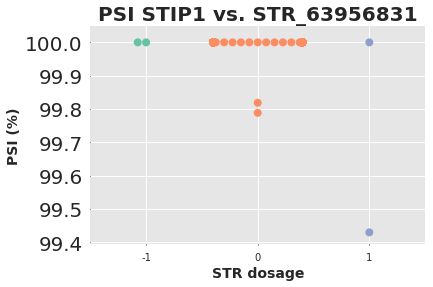

ENSG00000109046.10_2
STR_25629525

WSB1
WD repeat and SOCS box containing 1
Distance between STR and exon
543.0
9.516177886172756e-12


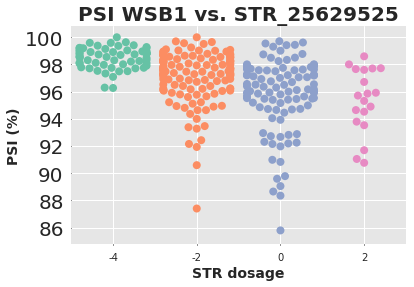

ENSG00000114686.4_10
STR_131218574

MRPL3
mitochondrial ribosomal protein L3
Distance between STR and exon
2114.0
1.2111706857205745e-11


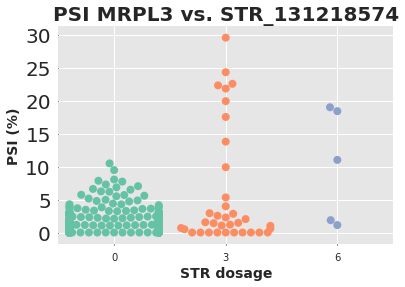

ENSG00000048140.13_4
STR_176086913

TSPAN17
tetraspanin 17
Distance between STR and exon
4892.0
1.8862685024405953e-11


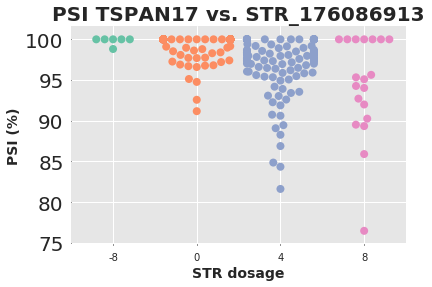

ENSG00000138744.10_4
STR_76833927

NAAA
N-acylethanolamine acid amidase
Distance between STR and exon
4693.0
2.1249108120470574e-11


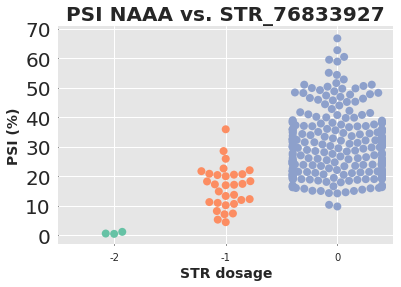

ENSG00000130023.11_19
STR_170167663

ERMARD
ER membrane associated RNA degradation
Distance between STR and exon
8888.0
3.153792690872798e-11


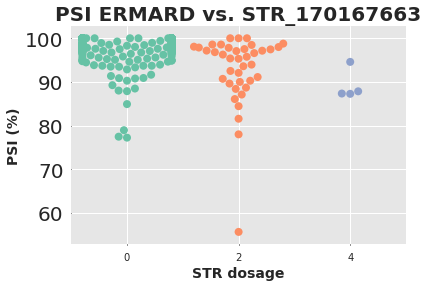

ENSG00000240344.4_2
STR_201737599

PPIL3
peptidylprolyl isomerase like 3
Distance between STR and exon
4621.0
4.900667438025782e-11


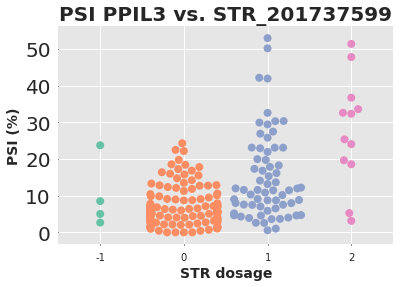

ENSG00000138744.10_5
STR_76833927

NAAA
N-acylethanolamine acid amidase
Distance between STR and exon
5987.0
5.028847673283248e-11


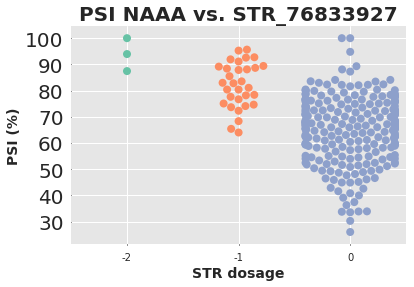

ENSG00000144559.6_2
STR_11842022

TAMM41
TAM41 mitochondrial translocator assembly and maintenance homolog
Distance between STR and exon
7787.0
5.185919993897112e-11


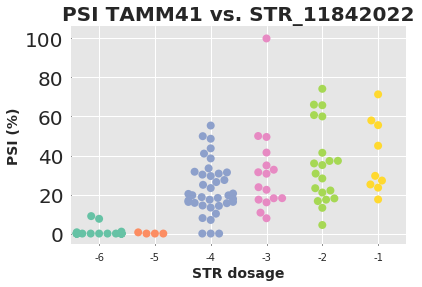

ENSG00000166796.7_2
STR_18431450

LDHC
lactate dehydrogenase C
Distance between STR and exon
5281.0
5.982137571490692e-11


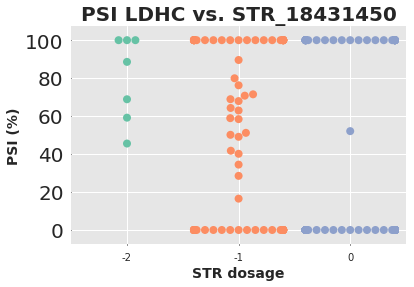

ENSG00000152689.13_19
STR_33762260

RASGRP3
RAS guanyl releasing protein 3
Distance between STR and exon
2458.0
5.982137571490692e-11


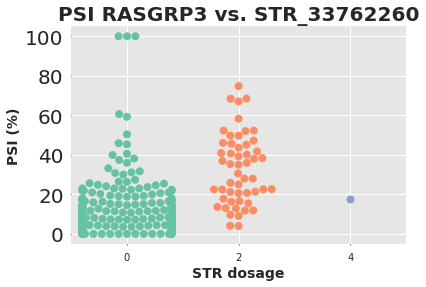

ENSG00000188732.6_6
STR_23731882

FAM221A
family with sequence similarity 221 member A
Distance between STR and exon
5929.0
5.982137571490692e-11


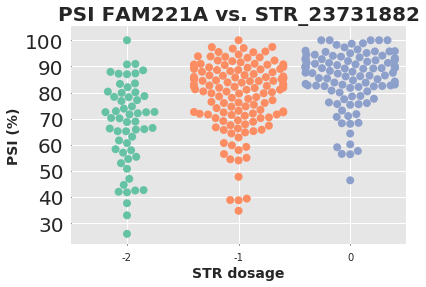

ENSG00000149089.8_8
STR_34917412

APIP
APAF1 interacting protein
Distance between STR and exon
755.0
6.329021177882159e-11


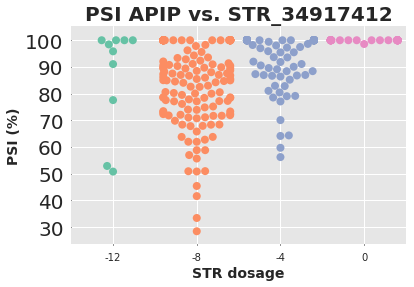

ENSG00000140379.7_1
STR_80267008

BCL2A1
BCL2 related protein A1
Distance between STR and exon
6974.0
6.526755791041753e-11


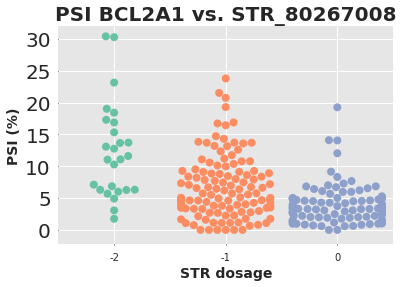

ENSG00000156795.2_6
STR_124448908

WDYHV1
WDYHV motif containing 1
Distance between STR and exon
1466.0
6.526755791041753e-11


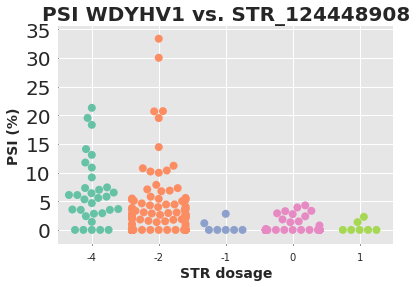

ENSG00000140945.11_2
STR_82672423

CDH13
cadherin 13
Distance between STR and exon
542.0
6.7219699688238e-11


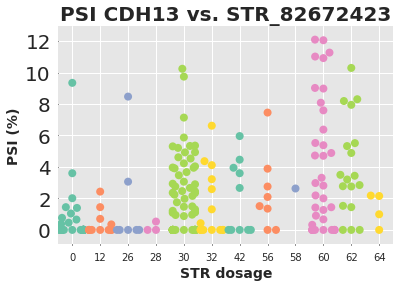

ENSG00000172530.15_26
STR_88102575

BANP
BTG3 associated nuclear protein
Distance between STR and exon
3100.0
6.767273048454791e-11


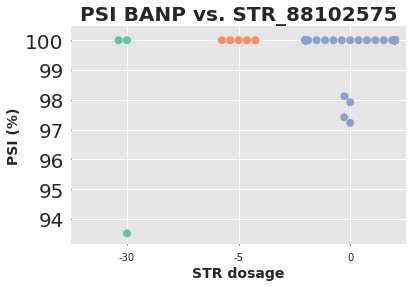

ENSG00000134463.10_3
STR_11795771

ECHDC3
enoyl-CoA hydratase domain containing 3
Distance between STR and exon
1518.0
1.1896826620243338e-10


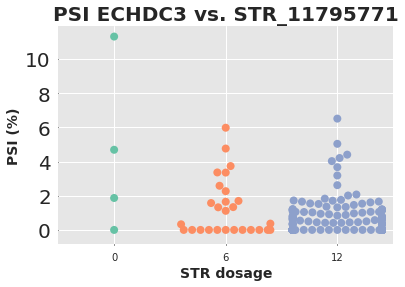

ENSG00000124588.15_4
STR_3001074

NQO2
N-ribosyldihydronicotinamide:quinone reductase 2
Distance between STR and exon
2829.0
1.2637659280446298e-10


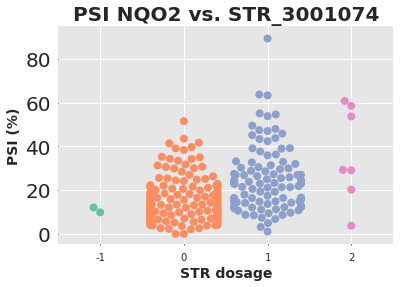

ENSG00000197603.9_8
STR_37146286

CPLANE1
ciliogenesis and planar polarity effector 1
Distance between STR and exon
6814.0
1.3658459308698473e-10


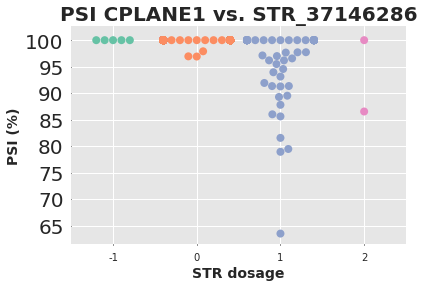

ENSG00000152284.4_3
STR_85395316

TCF7L1
transcription factor 7 like 1
Distance between STR and exon
820.0
1.8787063177389374e-10


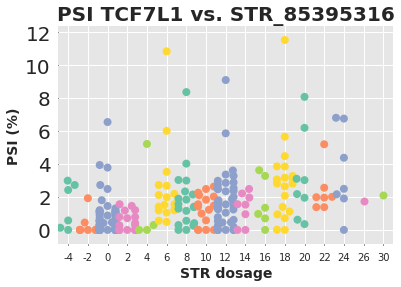

ENSG00000120742.6_4
STR_150306880

SERP1
stress associated endoplasmic reticulum protein 1
Distance between STR and exon
3601.0
1.8847890262337171e-10


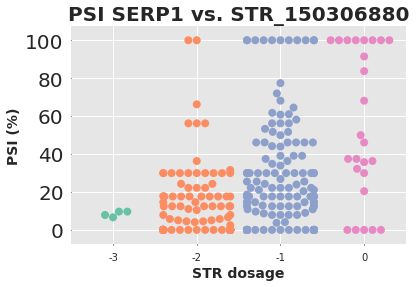

ENSG00000156170.8_5
STR_95989827

NDUFAF6
NADH:ubiquinone oxidoreductase complex assembly factor 6
Distance between STR and exon
1616.0
1.8923695844804636e-10


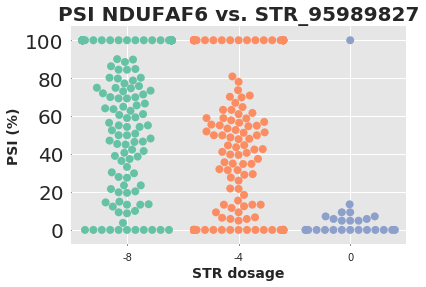

ENSG00000161533.7_10
STR_73963550

ACOX1
acyl-CoA oxidase 1
Distance between STR and exon
9903.0
1.8923695844804636e-10


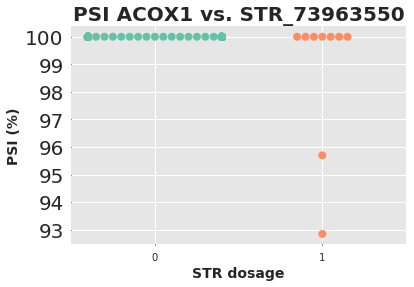

ENSG00000172061.7_1
STR_194082856

LRRC15
leucine rich repeat containing 15
Distance between STR and exon
1229.0
2.0863807560979723e-10


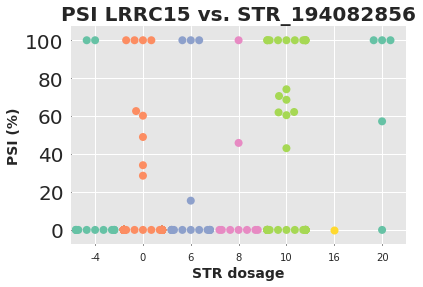

ENSG00000149196.11_3
STR_86040232

HIKESHI
Hikeshi, heat shock protein nuclear import factor
Distance between STR and exon
2514.0
2.1620726675824246e-10


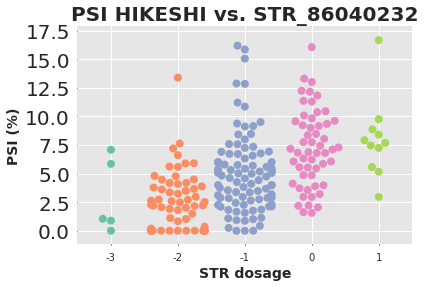

ENSG00000163017.9_4
STR_74133579

ACTG2
actin, gamma 2, smooth muscle, enteric
Distance between STR and exon
3964.0
2.1620726675824246e-10


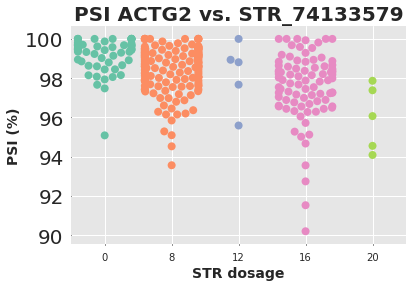

ENSG00000205629.7_1
STR_25137154

LCMT1
leucine carboxyl methyltransferase 1
Distance between STR and exon
131.0
2.328612712617284e-10


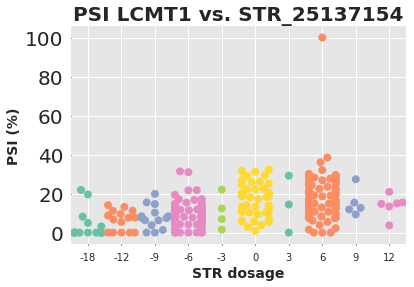

ENSG00000164654.11_0
STR_7614416

MIOS
meiosis regulator for oocyte development
Distance between STR and exon
6662.0
2.6076980008693933e-10


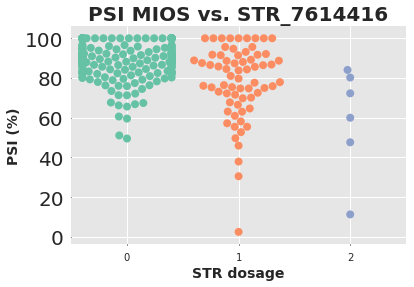

ENSG00000137054.11_4
STR_37499507

POLR1E
RNA polymerase I subunit E
Distance between STR and exon
7135.0
2.613514595814685e-10


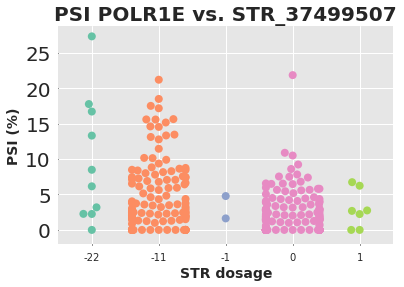

ENSG00000180902.12_7
STR_242686808

D2HGDH
D-2-hydroxyglutarate dehydrogenase
Distance between STR and exon
1434.0
2.7474342718797893e-10


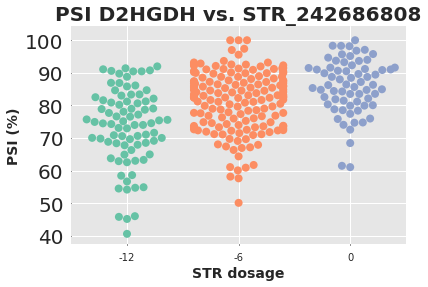

ENSG00000125450.6_13
STR_73213462

NUP85
nucleoporin 85
Distance between STR and exon
9378.0
4.175657215271124e-10


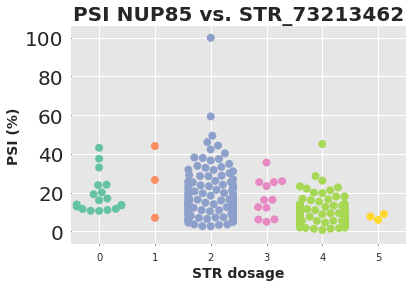

ENSG00000120451.6_10
STR_130773568

SNX19
sorting nexin 19
Distance between STR and exon
4280.0
4.2659010523748105e-10


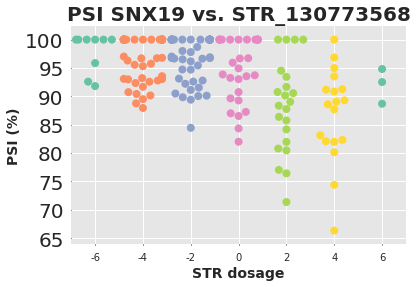

ENSG00000119185.8_2
STR_9552384

ITGB1BP1
integrin subunit beta 1 binding protein 1
Distance between STR and exon
1923.0
4.2659010523748105e-10


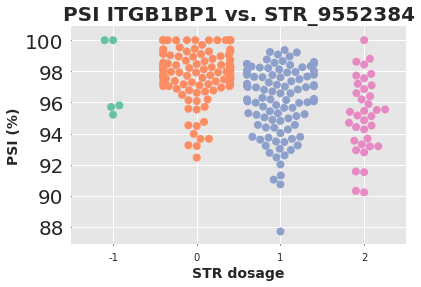

ENSG00000174125.3_4
STR_38808402

TLR1
toll like receptor 1
Distance between STR and exon
2399.0
4.782986209278569e-10


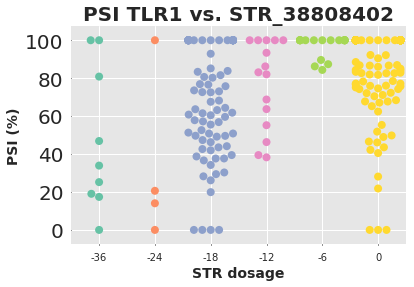

ENSG00000087157.14_2
STR_76379333

PGS1
phosphatidylglycerophosphate synthase 1
Distance between STR and exon
467.0
5.314138267752526e-10


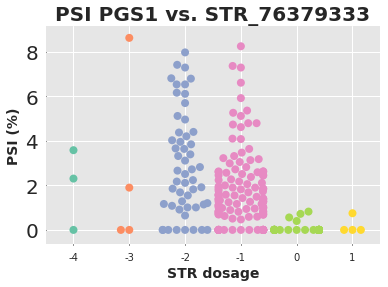

ENSG00000188186.6_2
STR_99745238

LAMTOR4
late endosomal/lysosomal adaptor, MAPK and MTOR activator 4
Distance between STR and exon
1744.0
5.499885752733768e-10


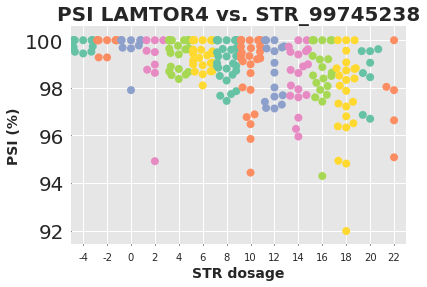

ENSG00000204954.5_1
STR_104345413

C12orf73
chromosome 12 open reading frame 73
Distance between STR and exon
3017.0
5.688403360755202e-10


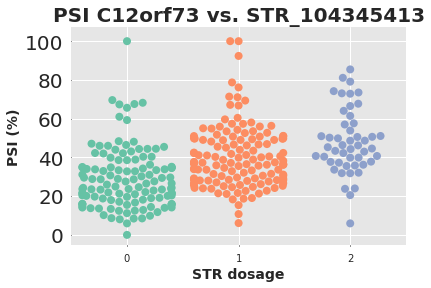

ENSG00000164048.9_3
STR_48290588

ZNF589
zinc finger protein 589
Distance between STR and exon
8831.0
6.23943982030184e-10


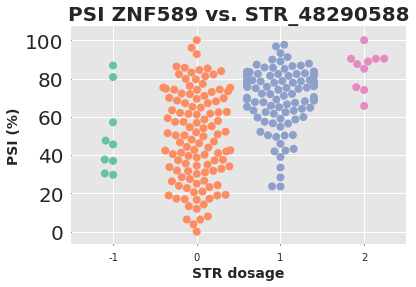

ENSG00000110619.12_19
STR_3054282

CARS
cysteinyl-tRNA synthetase
Distance between STR and exon
7396.0
6.898079195183162e-10


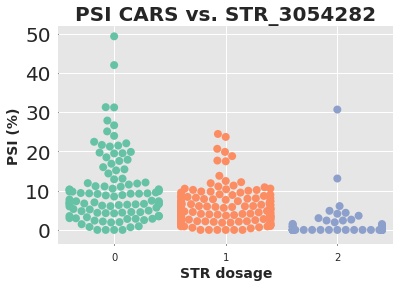

ENSG00000136153.15_2
STR_76209139

LMO7
LIM domain 7
Distance between STR and exon
807.0
6.898079195183162e-10


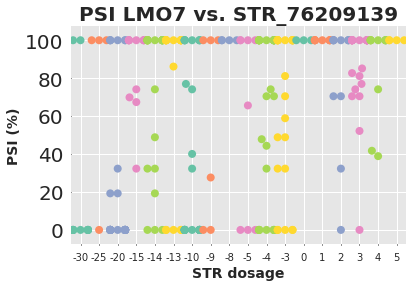

ENSG00000090006.13_30
STR_41126363

LTBP4
latent transforming growth factor beta binding protein 4
Distance between STR and exon
1943.0
6.991704215206022e-10


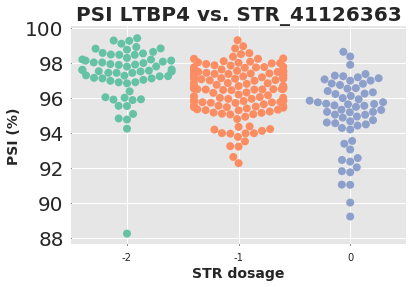

ENSG00000109323.4_16
STR_103681247

MANBA
mannosidase beta
Distance between STR and exon
6095.0
7.384223229986152e-10


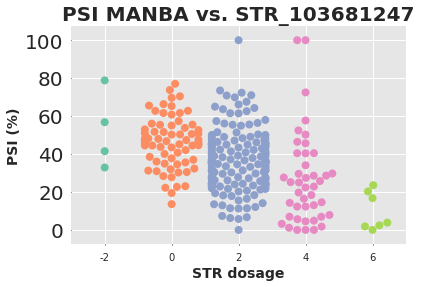

ENSG00000172349.12_14
STR_81581165

IL16
interleukin 16
Distance between STR and exon
1080.0
7.827271597906575e-10


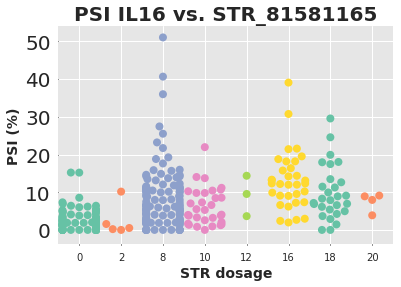

ENSG00000100412.11_6
STR_41915812

ACO2
aconitase 2
Distance between STR and exon
2356.0
8.061536555006304e-10


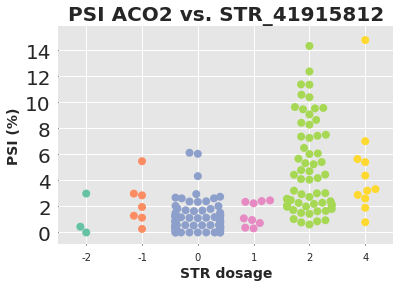

ENSG00000187741.10_9
STR_89829656

FANCA
FA complementation group A
Distance between STR and exon
455.0
8.181245359702301e-10


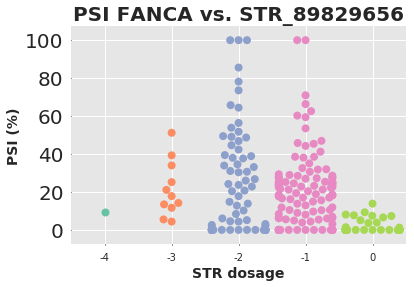

ENSG00000104714.9_5
STR_605661

ERICH1
glutamate rich 1
Distance between STR and exon
8539.0
1.0189319366527972e-09


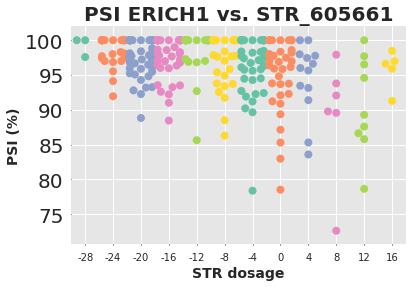

ENSG00000128563.9_4
STR_102027197

PRKRIP1
PRKR interacting protein 1
Distance between STR and exon
9227.0
1.2646012906794355e-09


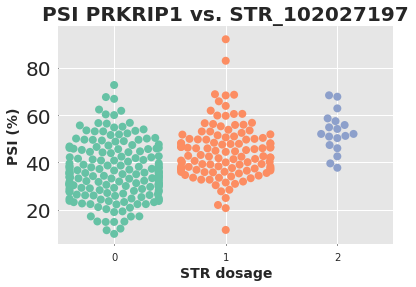

ENSG00000176915.10_2
STR_133315114

ANKLE2
ankyrin repeat and LEM domain containing 2
Distance between STR and exon
6318.0
1.4176121999356603e-09


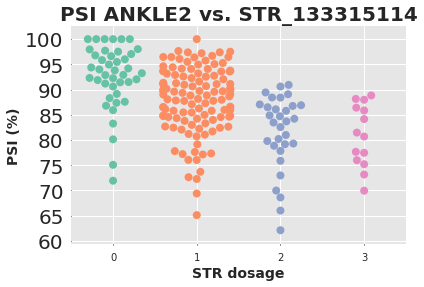

ENSG00000082438.11_8
STR_165563661

COBLL1
cordon-bleu WH2 repeat protein like 1
Distance between STR and exon
3931.0
1.4849451122211918e-09


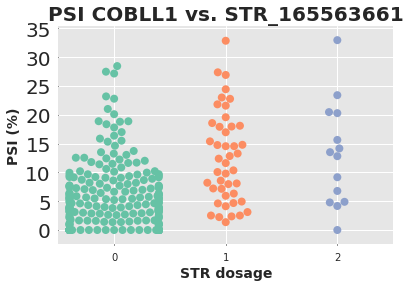

ENSG00000100376.7_9
STR_45724514

FAM118A
family with sequence similarity 118 member A
Distance between STR and exon
241.0
1.489302729414064e-09


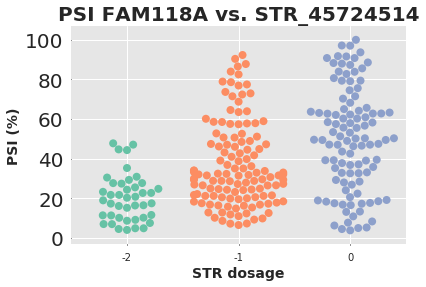

ENSG00000180376.12_8
STR_56600136

CCDC66
coiled-coil domain containing 66
Distance between STR and exon
903.0
1.5582553124365841e-09


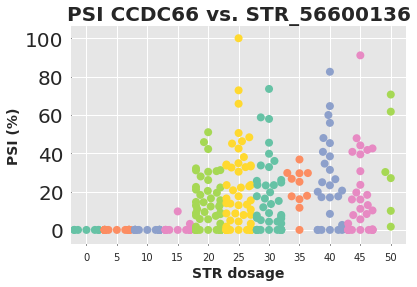

ENSG00000184497.8_2
STR_114462509

TMEM255B
transmembrane protein 255B
Distance between STR and exon
8600.0
1.5582553124365841e-09


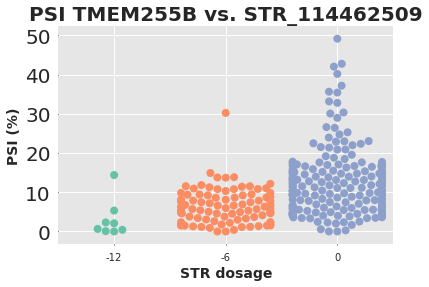

ENSG00000146070.12_8
STR_46688954

PLA2G7
phospholipase A2 group VII
Distance between STR and exon
4121.0
1.5588221436406709e-09


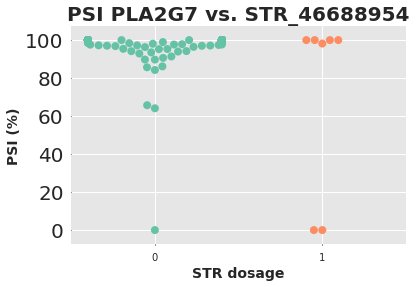

ENSG00000142089.11_1
STR_329930

IFITM3
interferon induced transmembrane protein 3
Distance between STR and exon
9682.0
1.8101646716105858e-09


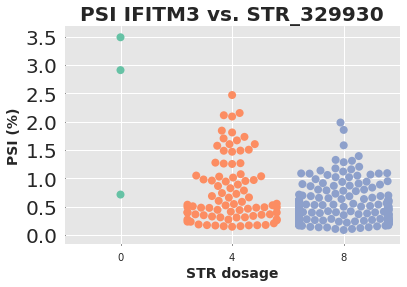

ENSG00000166797.6_5
STR_64377281

CIAO2A
cytosolic iron-sulfur assembly component 2A
Distance between STR and exon
5116.0
1.9303977021379405e-09


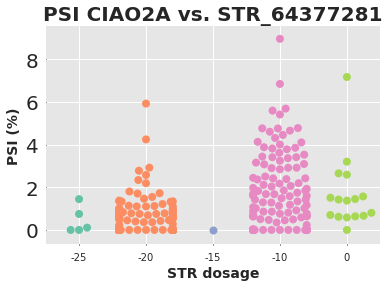

ENSG00000106034.13_24
STR_120908701

CPED1
cadherin like and PC-esterase domain containing 1
Distance between STR and exon
6729.0
2.2068778010199e-09


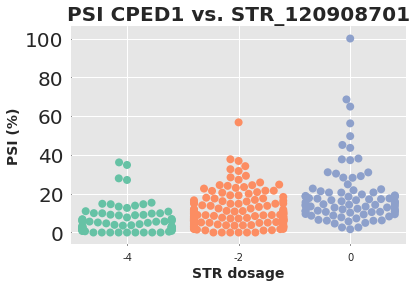

ENSG00000214113.6_6
STR_5187218

LYRM4
LYR motif containing 4
Distance between STR and exon
4.0
2.3302229762422015e-09


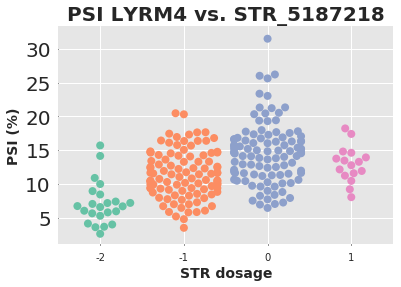

ENSG00000106785.10_7
STR_100873703

TRIM14
tripartite motif containing 14
Distance between STR and exon
1187.0
2.6400177437721736e-09


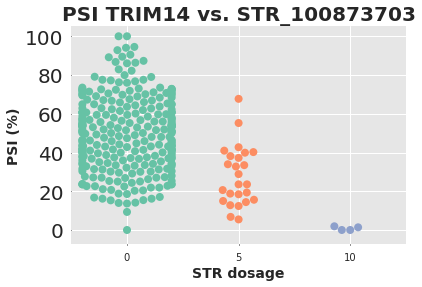

ENSG00000205060.6_1
STR_133988213

SLC35B4
solute carrier family 35 member B4
Distance between STR and exon
8284.0
2.983113767684497e-09


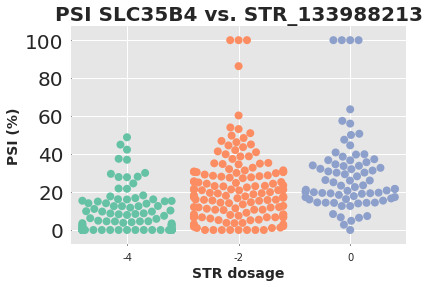

ENSG00000185420.14_12
STR_246220069

SMYD3
SET and MYND domain containing 3
Distance between STR and exon
3698.0
3.208488303234572e-09


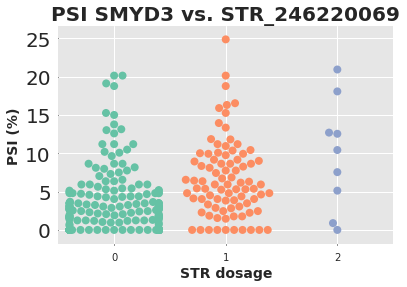

ENSG00000129354.7_2
STR_10682643

AP1M2
adaptor related protein complex 1 subunit mu 2
Distance between STR and exon
2937.0
3.2085120162412963e-09


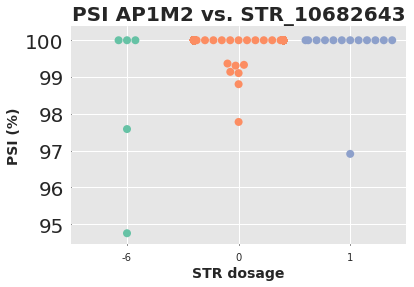

ENSG00000221947.3_2
STR_71589362

XKR9
XK related 9
Distance between STR and exon
2228.0
3.4592431508939754e-09


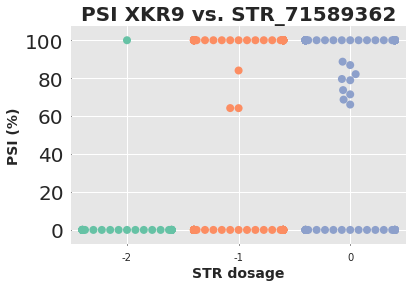

ENSG00000084072.12_9
STR_40203639

PPIE
peptidylprolyl isomerase E
Distance between STR and exon
7408.0
4.265923428782834e-09


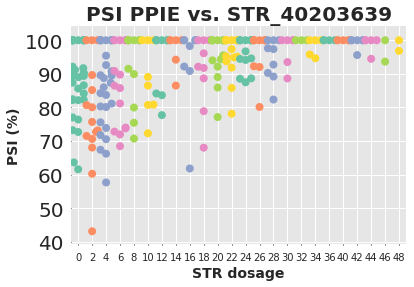

ENSG00000089157.11_2
STR_120630536

RPLP0
ribosomal protein lateral stalk subunit P0
Distance between STR and exon
5821.0
5.319978165520815e-09


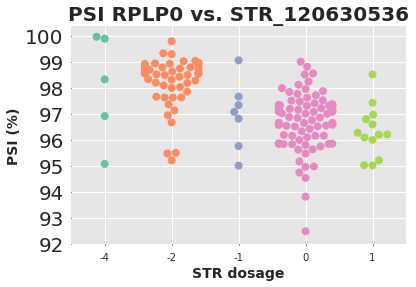

ENSG00000149925.12_11
STR_30069797

ALDOA
aldolase, fructose-bisphosphate A
Distance between STR and exon
9732.0
5.378188590901883e-09


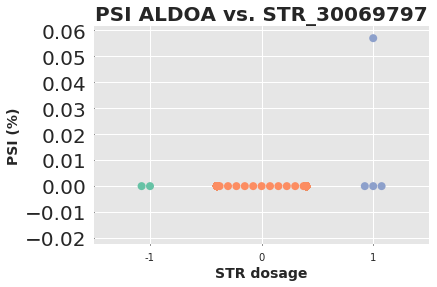

ENSG00000154889.12_14
STR_11912793

MPPE1
metallophosphoesterase 1
Distance between STR and exon
6841.0
5.479445456853161e-09


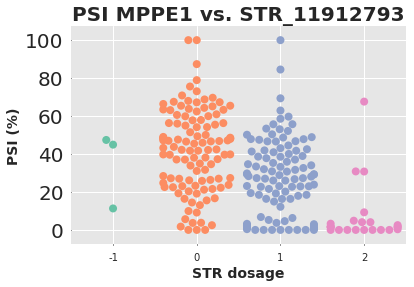

In [57]:
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
sns.set_style('darkgrid',{"axes.facecolor": "0.9",
                          'axes.grid' : True,
                          'grid.linestyle': u'-',
                          'xtick.major.size': 1,
                          'ytick.major.size': 0.5,})

count = 0
for idx in summary_table.index[:200]:
    exon_df = summary_table.loc[idx]
    gene = exon_df['exon']
    STR = exon_df['str.id']
    chrom = exon_df['chrom']

    
    print(gene)
    print(STR)
    print()
    gene_symbol = names[count]['symbol']
    gene_info  = names[count]['name']
    print(gene_symbol)
    print(gene_info)
    count+=1
    exon_info = expr_annot[expr_annot['probe.id'] == gene]
    exon_start = int(exon_info['probe.start'])
    exon_stop = int(exon_info['probe.stop'])
    STR_start = int(STR.split('_')[1])
    print('Distance between STR and exon')
    print(min(math.fabs(STR_start - exon_start),math.fabs(STR_start - exon_stop)))
    p_val = exon_df['q.values']
    print(p_val)
    
    strgt = strgt_all[chrom]
    expr = expr_all[chrom]
    
    str_samples = list(set(strgt.columns[2:].values))
    samples_to_remove = []
    for item in str_samples:
        if item not in expr.index: samples_to_remove.append(item) #str_samples.remove(item)
    for item in samples_to_remove: str_samples.remove(item)
    expr = expr.loc[str_samples,:]
    cis_strs = strgt[strgt['start'] == STR_start].dropna(axis=0)
    
    for j in range(cis_strs.shape[0]):
        # cis STR data
        locus_str = cis_strs.iloc[[j],:][str_samples].transpose()
        locus_str.index = str_samples
        locus_str.columns = ["STR_%s"%(cis_strs["start"].values[j])]
        test_str=locus_str.columns[0]
        str_start = cis_strs["start"].values[j]

    samples_to_keep = [str_samples[k] for k in range(len(str_samples)) if str(locus_str.iloc[:,0].values[k]) != "None" and \
                       str(locus_str.iloc[:,0].values[k]) != 'NA,NA' and \
                       str(locus_str.iloc[:,0].values[k]).split(',')[0] != 'NA' and \
                       str(locus_str.iloc[:,0].values[k]).split(',')[1] != 'NA']
    
    
    locus_str['x1'] = locus_str[test_str].apply(lambda x: x.split(',')[0] )
    locus_str['x2'] = locus_str[test_str].apply(lambda x: x.split(',')[1] )

    locus_str = locus_str.loc[samples_to_keep,:]
    locus_str['x1+x2'] = locus_str['x1'].astype(float) + locus_str['x2'].astype(float)

    y = pd.DataFrame({"expr":list(expr.loc[:, gene])})
    y.index = str_samples
    locus_y = y.loc[samples_to_keep,:]
    Locus_data = locus_str.join(locus_y)
    
    sns.swarmplot(locus_str['x1+x2'].astype(int),locus_y["expr"],palette= sns.color_palette("Set2"),size=8)
    plt.xlabel('STR dosage',fontsize=14,fontweight='bold')
    plt.ylabel('PSI (%)',fontsize=14,fontweight='bold')
    plt.title('PSI {} vs. {}'.format(gene_symbol,STR),fontsize=20,fontweight='bold')
    ax = plt.gca()
    ax.grid(True)
    plt.xticks(size = 10)
    plt.yticks(size = 20)
    plt.show()

## DISTANCE BETWEEN SIGNFICANT STRS AND EXONS

querying 1-1000...done.
querying 1001-1203...done.
Finished.
170 input query terms found dup hits:
	[('ENSG00000158411', 2), ('ENSG00000018510', 3), ('ENSG00000085719', 2), ('ENSG00000084072', 3), ('E
7 input query terms found no hit:
	['ENSG00000165659', 'ENSG00000077809', 'ENSG00000174100', 'ENSG00000108264', 'ENSG00000236624', 'ENS
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


(array([143., 133., 129., 112., 111., 130., 118.,  95., 131., 101.]),
 array([2.0000e+00, 1.0006e+03, 1.9992e+03, 2.9978e+03, 3.9964e+03,
        4.9950e+03, 5.9936e+03, 6.9922e+03, 7.9908e+03, 8.9894e+03,
        9.9880e+03]),
 <a list of 10 Patch objects>)

/usr/lib64/python3.4/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


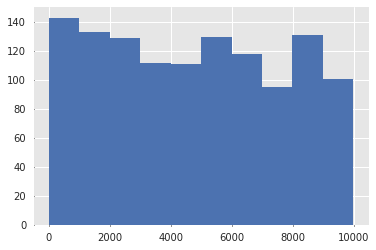

In [41]:
sig_table = summary_table[summary_table['q.values'] < 0.01]
mg = mygene.MyGeneInfo()
genes = [gene.split('.')[0] for gene in sig_table['exon']]
sig_names = mg.querymany(genes, scopes='ensembl.gene')
distances = []
count = 0
for idx in sig_table.index:
    exon_df = sig_table.loc[idx]
    gene = exon_df['exon']
    STR = exon_df['str.id']

    exon_info = expr_annot[expr_annot['probe.id'] == gene]
    exon_start = int(exon_info['probe.start'])
    exon_stop = int(exon_info['probe.stop'])
    STR_start = int(STR.split('_')[1])
    distances.append(min(math.fabs(STR_start - exon_start),math.fabs(STR_start - exon_stop)))
plt.hist(distances)

/usr/lib64/python3.4/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


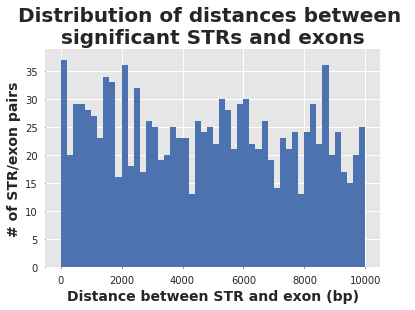

In [49]:
plt.hist(distances,bins=50)
plt.xlabel('Distance between STR and exon (bp)',fontsize=14,fontweight='bold')
plt.ylabel('# of STR/exon pairs',fontsize=14,fontweight='bold')
plt.title('Distribution of distances between \nsignificant STRs and exons',fontsize=20,fontweight='bold')
plt.show()

In [17]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
def ZNorm(vals,m,sd):
    if m is None:
        m = np.mean(vals)
        sd = math.sqrt(np.var(vals))
    if sd == 0: return None
    return [(item-m)/sd for item in vals]

def LinearRegression(data, Y, norm=False, minsamples=0, alleles=False):
    """
    Perform linear regression, return beta, beta_se, p
    """
    print(alleles, norm)
    if norm:
        if alleles:
            data['x1+x2'] = data['x1'].astype(float) + data['x2'].astype(float)
            X = ZNorm(data['x1+x2'], None, None)
        else:
            X = ZNorm(data,None, None) 
            Y = ZNorm(Y, None, None)
        if X is None or Y is None: return None, None, None
        if np.var(X)==0: return None, None, None
        if len(X) <= minsamples: return None, None, None
    else:
        X = np.array(data,dtype=int)
        print('Here!!!!!!')
    X = sm.add_constant(X)
    print('X: '.format(X))
    mod_ols = sm.OLS(Y, X, missing='drop')
    print(mod_ols)
    res_ols = mod_ols.fit()
    pval = res_ols.pvalues[1]
    print('P-value: ', pval) 
    slope = res_ols.params[1]
    err = res_ols.bse[1]
    return res_ols, slope, err, pval

/usr/lib/python3.4/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/usr/lib64/python3.4/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


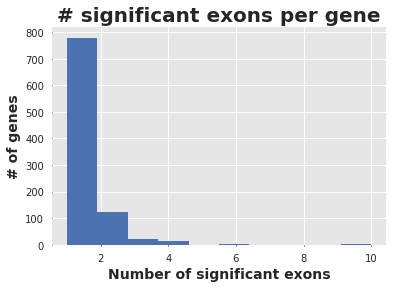

In [56]:
sig_table['gene'] = [exon.split('.')[0] for exon in sig_table['exon']]
plt.hist(sig_table['gene'].value_counts())
plt.xlabel('Number of significant exons',fontsize=14,fontweight='bold')
plt.ylabel('# of genes',fontsize=14,fontweight='bold')
plt.title('# significant exons per gene',fontsize=20,fontweight='bold')
plt.show()

In [24]:
min_str_position = min(chr_1['str.start'])
chr_1['adj.start'] = chr_1['str.start'] - min_str_position

(-10, 250000000)

/usr/lib64/python3.4/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


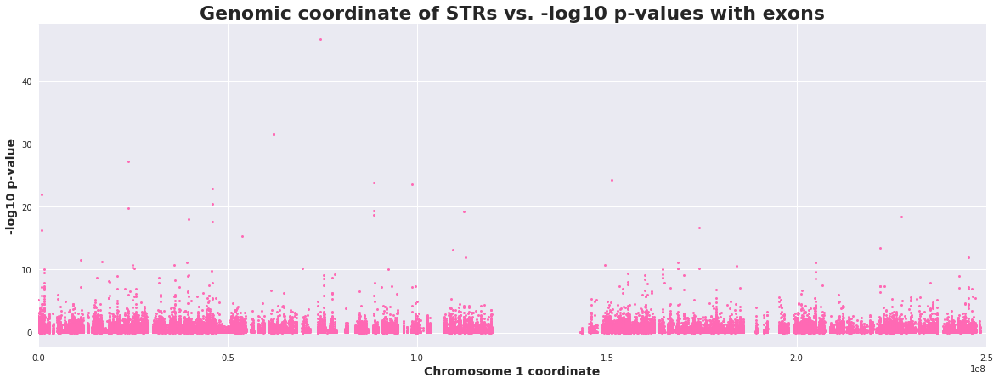

In [26]:
plt.figure(figsize=(20,7))
plt.plot(chr_1['adj.start'], p_values_log, linestyle='', marker='o', markersize=3,color='hotpink')
plt.xlabel('Chromosome 1 coordinate',fontweight='bold',fontsize=14)
plt.ylabel('-log10 p-value',fontweight='bold',fontsize=14)
plt.title('Genomic coordinate of STRs vs. -log10 p-values with exons',fontweight='bold',fontsize=22)
plt.xlim(-10,250000000)

In [3]:
str_starts = [63013887,152180982,99374773,222798358]

In [4]:
small_strgt = strgt[strgt.start.isin(str_starts)]
small_strgt

,chrom,start,GTEX-PLZ4,GTEX-NFK9,GTEX-OHPM,GTEX-X4EO,GTEX-UTHO,GTEX-TMZS,GTEX-WY7C,GTEX-P44H,...,GTEX-1212Z,GTEX-14C39,GTEX-131XF,GTEX-111YS,GTEX-ZXES,GTEX-11WQK,GTEX-ZVP2,GTEX-Y8E4,GTEX-1GN2E,GTEX-14PJM
37483,chr1,63013887,"0,0","0,0","0,-1","0,0","0,0","0,0","0,0","0,0",...,"0,0","0,0","NA,NA","NA,NA","NA,NA","NA,NA","0,0","0,0","0,0","0,0"
53938,chr1,99374773,"0,0","0,0","0,0","0,10","0,10","NA,NA","NA,NA","0,0",...,"0,0","NA,NA","0,0","0,10","0,10","10,10","0,0","0,0","0,0","0,0"
65918,chr1,152180982,"0,0","0,0","0,0","0,0","0,0","NA,NA","0,0","NA,NA",...,"0,0","0,0","NA,NA","0,0","0,0","NA,NA","0,0","0,0","0,0","0,0"
100577,chr1,222798358,"0,0","0,0","0,0","0,0","0,0","0,0","NA,NA","0,0",...,"0,0","0,0","NA,NA","0,0","NA,NA","0,0","NA,NA","0,0","NA,NA","0,0"


In [ ]:
str_df = strgt #[small_strgt.columns[2:]]
strs_to_keep = []
for _str in str_df.index:
        one_str_geno = str_df.loc[_str][2:]
        one_str_sum = []
        for gt in one_str_geno:
            try:
                new_gt = int(gt.split(',')[0]) + int(gt.split(',')[1])
            except:
                new_gt = 'NA,NA'
            one_str_sum.append(new_gt)
        one_str_sum = pd.Series(one_str_sum)
        unique_vals = one_str_sum.value_counts(dropna=True)
        good_gts = unique_vals[unique_vals >= 5].index
        if len(good_gts) >= 3:
            strs_to_keep.append(int(_str))
            str_df.loc[_str][2:] = [one_str_geno[sample] if one_str_sum[sample] in good_gts else 'NA,NA' for sample in one_str_sum.index]
        else:
            continue
str_df.loc[strs_to_keep]

In [ ]:
str_df

In [10]:
str_df.loc[_str][2:]

GTEX-PLZ4       0,9
GTEX-NFK9       0,9
GTEX-OHPM       0,9
GTEX-X4EO     NA,NA
GTEX-UTHO     NA,NA
GTEX-TMZS     NA,NA
GTEX-WY7C     NA,NA
GTEX-P44H       0,0
GTEX-PWCY       0,9
GTEX-OIZF       0,0
GTEX-PSDG       0,9
GTEX-VJYA     NA,NA
GTEX-POMQ       0,0
GTEX-NL3H       0,9
GTEX-OXRN       0,0
GTEX-XOT4     NA,NA
GTEX-WK11     NA,NA
GTEX-S95S       0,0
GTEX-T6MO       0,0
GTEX-R55C       0,0
GTEX-RM2N     NA,NA
GTEX-SUCS     NA,NA
GTEX-XMK1       0,0
GTEX-XUW1       0,9
GTEX-WFG7     NA,NA
GTEX-OIZG       0,0
GTEX-R55G     NA,NA
GTEX-T6MN     NA,NA
GTEX-WCDI     NA,NA
GTEX-REY6     NA,NA
              ...  
GTEX-ZYVF     NA,NA
GTEX-14A5I      0,0
GTEX-ZVT2     NA,NA
GTEX-16NFA    NA,NA
GTEX-1GN1V      0,9
GTEX-145MH      0,9
GTEX-14BIM      0,0
GTEX-14PJN      0,0
GTEX-X4EP     NA,NA
GTEX-14PN3      0,0
GTEX-U3ZM     NA,NA
GTEX-QDVN     NA,NA
GTEX-ZEX8       0,0
GTEX-131YS      0,0
GTEX-14PQA      0,0
GTEX-15CHQ      0,0
GTEX-QVJO     NA,NA
GTEX-1314G      0,0
GTEX-R53T     NA,NA


(0, 50)

/usr/lib64/python3.4/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


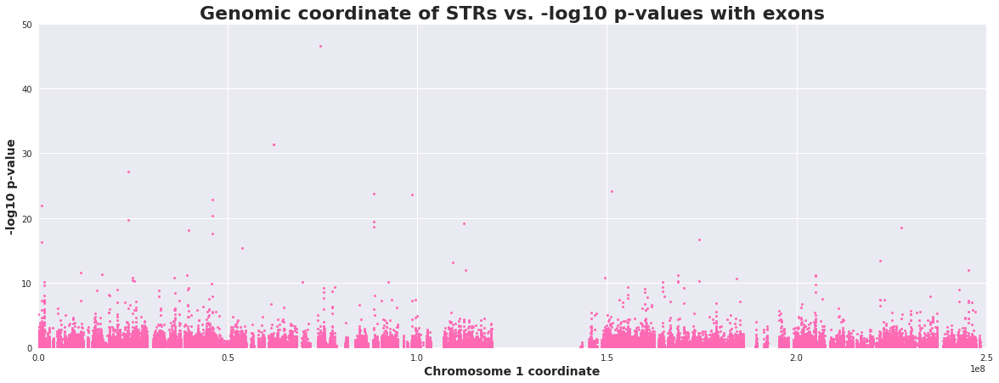

In [27]:
plt.figure(figsize=(20,7))
plt.plot(chr_1['adj.start'], p_values_log, linestyle='', marker='o', markersize=3,color='hotpink')
plt.xlabel('Chromosome 1 coordinate',fontweight='bold',fontsize=14)
plt.ylabel('-log10 p-value',fontweight='bold',fontsize=14)
plt.title('Genomic coordinate of STRs vs. -log10 p-values with exons',fontweight='bold',fontsize=22)
plt.xlim(-10,250000000)
plt.ylim(0,50)